# WageWizard

Since the decision tree regressor in the voting classifier is outputting various warning due to failed fitting for various parameters during the fine-tuning process, we have import a warning handler just to avoid having error through the model.

In [5]:
# pip install pandas && pip install matplotlib && pip install tensorflow && pip install scikit-learn && pip install xgboost && pip install seaborn && pip install matplotlib

In [6]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Dropout, LayerNormalization, MultiHeadAttention, Layer
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.initializers import HeNormal, GlorotUniform
from tensorflow.keras.regularizers import L2
from sklearn.metrics import mean_squared_error, mean_absolute_error
from scipy.stats import ttest_ind, f_oneway, chi2_contingency
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import RandomizedSearchCV, cross_val_score, train_test_split, KFold
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, VotingRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from xgboost import XGBRegressor
import warnings
warnings.filterwarnings("ignore")


In [7]:
# To Import files from Google Drive folder 
#from google.colab import drive
# drive.mount('/content/drive')

# Data Preprocessing
- Extract, Transform and Load (ETL)

## Extract the dataset into Dataframes

#### Extracting the Dataset (Job Description, Company Information, and Country Population)

Extract Job description dataset

In [8]:
data = pd.read_csv('job_descriptions.csv')
data

,Job Id,Experience,Qualifications,Salary Range,location,Country,latitude,longitude,Work Type,Company Size,...,Contact,Job Title,Role,Job Portal,Job Description,Benefits,skills,Responsibilities,Company,Company Profile
0,1089843540111562,5 to 15 Years,M.Tech,$59K-$99K,Douglas,Isle of Man,54.2361,-4.5481,Intern,26801,...,001-381-930-7517x737,Digital Marketing Specialist,Social Media Manager,Snagajob,Social Media Managers oversee an organizations...,"{'Flexible Spending Accounts (FSAs), Relocatio...","Social media platforms (e.g., Facebook, Twitte...","Manage and grow social media accounts, create ...",Icahn Enterprises,"{""Sector"":""Diversified"",""Industry"":""Diversifie..."
1,398454096642776,2 to 12 Years,BCA,$56K-$116K,Ashgabat,Turkmenistan,38.9697,59.5563,Intern,100340,...,461-509-4216,Web Developer,Frontend Web Developer,Idealist,Frontend Web Developers design and implement u...,"{'Health Insurance, Retirement Plans, Paid Tim...","HTML, CSS, JavaScript Frontend frameworks (e.g...","Design and code user interfaces for websites, ...",PNC Financial Services Group,"{""Sector"":""Financial Services"",""Industry"":""Com..."
2,481640072963533,0 to 12 Years,PhD,$61K-$104K,Macao,"Macao SAR, China",22.1987,113.5439,Temporary,84525,...,9687619505,Operations Manager,Quality Control Manager,Jobs2Careers,Quality Control Managers establish and enforce...,"{'Legal Assistance, Bonuses and Incentive Prog...",Quality control processes and methodologies St...,Establish and enforce quality control standard...,United Services Automobile Assn.,"{""Sector"":""Insurance"",""Industry"":""Insurance: P..."
3,688192671473044,4 to 11 Years,PhD,$65K-$91K,Porto-Novo,Benin,9.3077,2.3158,Full-Time,129896,...,+1-820-643-5431x47576,Network Engineer,Wireless Network Engineer,FlexJobs,"Wireless Network Engineers design, implement, ...","{'Transportation Benefits, Professional Develo...",Wireless network design and architecture Wi-Fi...,"Design, configure, and optimize wireless netwo...",Hess,"{""Sector"":""Energy"",""Industry"":""Mining, Crude-O..."
4,117057806156508,1 to 12 Years,MBA,$64K-$87K,Santiago,Chile,-35.6751,-71.5429,Intern,53944,...,343.975.4702x9340,Event Manager,Conference Manager,Jobs2Careers,A Conference Manager coordinates and manages c...,"{'Flexible Spending Accounts (FSAs), Relocatio...",Event planning Conference logistics Budget man...,Specialize in conference and convention planni...,Cairn Energy,"{""Sector"":""Energy"",""Industry"":""Energy - Oil & ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1615935,134563577088850,0 to 12 Years,B.Tech,$64K-$114K,"Malabo (de jure),",Equatorial Guinea,1.6508,10.2679,Full-Time,18281,...,950-451-5843,Mechanical Engineer,Mechanical Design Engineer,ZipRecruiter,Mechanical Design Engineers create and develop...,"{'Employee Assistance Programs (EAP), Tuition ...","Mechanical engineering CAD software (e.g., Sol...","Design mechanical systems, components, and pro...",The Hershey Company,"{""Sector"":""Food and Beverage/Confectionery"",""I..."
1615936,618604818190827,2 to 14 Years,M.Tech,$62K-$130K,Warsaw,Poland,51.9194,19.1451,Intern,63621,...,676.387.1572x71877,IT Manager,IT Director,USAJOBS,An IT Director oversees an organizations IT de...,"{'Health Insurance, Retirement Plans, Paid Tim...",Strategic IT planning Leadership and managemen...,Provide strategic leadership for IT department...,EQT,"{""Sector"":""Energy"",""Industry"":""Energy"",""City"":..."
1615937,615471367712200,4 to 15 Years,BCA,$60K-$96K,Ashgabat,Turkmenistan,38.9697,59.5563,Part-Time,114287,...,537.384.6193x5284,Mechanical Engineer,Mechanical Design Engineer,Indeed,Mechanical Design Engineers create and develop...,"{'Tuition Reimbursement, Stock Options or Equi...","Mechanical engineering CAD software (e.g., Sol...","Design mechanical systems, components, and pro...",KLA,"{""Sector"":""Technology"",""Industry"":""Semiconduct..."
1615938,804137342023945,5 to 15 Years,BCA,$65K-$103K,Ouagadougou,Burk

#### Extract city population

In [9]:
data_population = pd.read_csv('CityPopulation.csv')
data_population

,Country,City,City Population
0,USA,"Washington, D.C.","678,972"
1,UK,London,"9,748,000"
2,Canada,Ottawa,"1,077,900"
3,France,Paris,"11,208,000"
4,Belgium,Brussels,"1,222,657"
5,Australia,Canberra,"472,000"
6,Spain,Madrid,"6,751,000"
7,India,New Delhi,"32,941,000"
8,Germany,Berlin,"3,574,000"
9,Singapore,Singapore,"6,014,723"


#### Extract Population datasets

In [10]:
data_company = pd.read_csv('CompanyInformation.csv')
data_company

,Company,Country,Company Size
0,3i Group,UK,249
1,3M,USA,95000
2,A-Mark Precious Metals,USA,429
3,Abbott Laboratories,USA,113000
4,AbbVie,USA,50000
...,...,...,...
883,XPO,USA,42000
884,Yum China Holdings,USA,450000
885,Zee Entertainment Enterprises,India,3400
886,Zoetis,USA,11700


## Transform

In [11]:
pd.options.mode.copy_on_write = True #https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

In [12]:
print(data.dtypes)

Job Id                int64
Experience           object
Qualifications       object
Salary Range         object
location             object
Country              object
latitude            float64
longitude           float64
Work Type            object
Company Size          int64
Job Posting Date     object
Preference           object
Contact Person       object
Contact              object
Job Title            object
Role                 object
Job Portal           object
Job Description      object
Benefits             object
skills               object
Responsibilities     object
Company              object
Company Profile      object
dtype: object


Based on the countries from the population dataset, we only retained countries that are present in both the population and job descriptions datasets for the trend analysis. Since the data in the population dataset is limited, the countries were hand-picked instead of using a function.

In [13]:
# Define the values to keep in the "Country" column
desired_countries = ['USA', 'UK', 'Canada', 'France', 'Japan', 'Belgium', 'Australia', 'Spain', 'India', 'Germany', 'Singapore', 'Thailand', 'China', 'Portugal', 'Vietnam', 'Mauritius']

# Filter the DataFrame to keep only rows with desired countries
df = data[data['Country'].isin(desired_countries)]

#### Drop Unnecessary Columns
- Since the company profile dataset contains more accurate information about the company size, we will replace the current information in the job description table with the data from the company profile dataset.

In [14]:
df = df.drop(columns = ['latitude', 'longitude', 'Contact Person', 'Contact', 'Job Description', 'Company Size', 'Responsibilities' , 'Job Id'])
df

,Experience,Qualifications,Salary Range,location,Country,Work Type,Job Posting Date,Preference,Job Title,Role,Job Portal,Benefits,skills,Company,Company Profile
5,4 to 12 Years,MCA,$59K-$93K,Brussels,Belgium,Full-Time,2023-07-25,Male,Software Tester,Quality Assurance Analyst,Snagajob,"{'Life and Disability Insurance, Stock Options...",Quality assurance processes Testing methodolog...,Adani Ports and Special Economic Zone,"{""Sector"":""Infrastructure"",""Industry"":""Ports a..."
34,0 to 8 Years,M.Com,$62K-$130K,Canberra,Australia,Temporary,2022-11-02,Both,Electrical Designer,Lighting Designer,Idealist,"{'Life and Disability Insurance, Stock Options...",Lighting design Architectural lighting Lightin...,CBRE Group,"{""Sector"":""Real Estate"",""Industry"":""Real Estat..."
46,3 to 9 Years,B.Tech,$56K-$109K,Madrid,Spain,Temporary,2023-05-29,Male,Data Entry Clerk,Record Keeper,Jobs2Careers,"{'Legal Assistance, Bonuses and Incentive Prog...",Records management Data entry and retrieval At...,Arconic,"{""Sector"":""Manufacturing"",""Industry"":""Metals"",..."
61,5 to 12 Years,PhD,$57K-$125K,New Delhi,India,Full-Time,2022-09-28,Female,Account Executive,Sales Account Executive,Internships.com,"{'Flexible Spending Accounts (FSAs), Relocatio...",Sales strategies and tactics Account managemen...,GlaxoSmithKline,"{""Sector"":""Pharmaceuticals"",""Industry"":""Pharma..."
69,0 to 9 Years,B.Tech,$56K-$125K,London,UK,Intern,2022-08-03,Male,Data Engineer,Data Architect,Indeed,"{'Childcare Assistance, Paid Time Off (PTO), R...",Data architecture design Database management s...,Equitable Holdings,"{""Sector"":""Insurance"",""Industry"":""Insurance: L..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1615879,0 to 15 Years,B.Com,$64K-$113K,London,UK,Contract,2023-04-18,Male,Brand Manager,Product Brand Manager,USAJOBS,"{'Legal Assistance, Bonuses and Incentive Prog...",Product branding and marketing Product lifecyc...,Kinder Morgan,"{""Sector"":""Energy"",""Industry"":""Pipelines"",""Cit..."
1615885,2 to 13 Years,PhD,$65K-$126K,Bangkok,Thailand,Temporary,2022-04-14,Male,Event Coordinator,Event Planner,Idealist,"{'Legal Assistance, Bonuses and Incentive Prog...",Event planning and coordination Budget managem...,Chesapeake Energy,"{""Sector"":""Energy"",""Industry"":""Mining, Crude-O..."
1615911,4 to 9 Years,MBA,$60K-$87K,London,UK,Contract,2022-02-18,Both,Sales Consultant,Sales Advisor,Snagajob,"{'Childcare Assistance, Paid Time Off (PTO), R...",Sales strategies Customer relationship managem...,Unum Group,"{""Sector"":""Insurance"",""Industry"":""Insurance: L..."
1615930,1 to 14 Years,BCA,$65K-$125K,Madrid,Spain,Intern,2022-07-10,Both,Environmental Consultant,Sustainability Consultant,Internships.com,"{'Employee Assistance Programs (EAP), Tuition ...",Sustainability consulting Sustainability asses...,J.M. Smucker,"{""Sector"":""Food & Beverage"",""Industry"":""Food C..."


#### Renaming columns in the Job description dataframe to match preference

In [15]:
# Columns to rename in df
columns_to_rename = {
    'skills':'Skills',
    'location': 'City',
    'Preference': 'Gender Preference',
    'Role': 'Specialization',
}

df = df.rename(columns_to_rename, axis='columns')

# columns to rename in df_population
data_population.rename(columns={'City Population': 'Job City Population'}, inplace=True)

# column to rename in df_company
data_company.rename(columns={'Country': 'Company HQ Country'}, inplace=True)

#### Transforming the Job posting dates from objects to datetime for easy analysis, feature engineering and prediction

In [16]:
# convert date object to datetime
df['Job Posting Date'] = pd.to_datetime(df['Job Posting Date'])
df.dtypes

Experience                   object
Qualifications               object
Salary Range                 object
City                         object
Country                      object
Work Type                    object
Job Posting Date     datetime64[ns]
Gender Preference            object
Job Title                    object
Specialization               object
Job Portal                   object
Benefits                     object
Skills                       object
Company                      object
Company Profile              object
dtype: object

#### Extract the day, month, and year for each job in the job posting date columns and add them to 3 separate columns

In [17]:
df['Day'] = df['Job Posting Date'].dt.day # extract day
df['Month'] = df['Job Posting Date'].dt.month # extract month
df['Year'] = df['Job Posting Date'].dt.year # extract year

#### Processing Salary Range and Years of Experience

In [18]:
# Split salary range in to minimum salary and maximum salary
df[['Minimum Salary', 'Maximum Salary']] = df['Salary Range'].str.split('-', expand=True)

# Keep only integers, replace every non digit character by a ""
df['Minimum Salary'] = df['Minimum Salary'].str.replace('[^\d]', '', regex=True).astype(int)
df['Maximum Salary'] = df['Maximum Salary'].str.replace('[^\d]', '', regex=True).astype(int)

#### Transform salary into actual figures instead of in thousands unit

In [19]:
df['Minimum Salary'] *= 1000
df['Maximum Salary'] *= 1000

In [20]:
# Split Years of experience range in to minimum experience and maximum experience
df[['Minimum Experience (years)', 'Maximum Experience (years)']] = df['Experience'].str.split('to', expand=True)

# Keep only integers, using a regex, replace every non digit character by a ""
df['Minimum Experience (years)'] = df['Minimum Experience (years)'].str.replace('[^\d]', '', regex=True).astype(int)
df['Maximum Experience (years)'] = df['Maximum Experience (years)'].str.replace('[^\d]', '', regex=True).astype(int)

#### Drop unnecessary columns (Experience, Salary, and Job Posting Date) after cleaning the columns data

In [21]:
# Drop unneeded columns
df = df.drop(columns=['Experience', 'Salary Range', 'Job Posting Date'])
df

,Qualifications,City,Country,Work Type,Gender Preference,Job Title,Specialization,Job Portal,Benefits,Skills,Company,Company Profile,Day,Month,Year,Minimum Salary,Maximum Salary,Minimum Experience (years),Maximum Experience (years)
5,MCA,Brussels,Belgium,Full-Time,Male,Software Tester,Quality Assurance Analyst,Snagajob,"{'Life and Disability Insurance, Stock Options...",Quality assurance processes Testing methodolog...,Adani Ports and Special Economic Zone,"{""Sector"":""Infrastructure"",""Industry"":""Ports a...",25,7,2023,59000,93000,4,12
34,M.Com,Canberra,Australia,Temporary,Both,Electrical Designer,Lighting Designer,Idealist,"{'Life and Disability Insurance, Stock Options...",Lighting design Architectural lighting Lightin...,CBRE Group,"{""Sector"":""Real Estate"",""Industry"":""Real Estat...",2,11,2022,62000,130000,0,8
46,B.Tech,Madrid,Spain,Temporary,Male,Data Entry Clerk,Record Keeper,Jobs2Careers,"{'Legal Assistance, Bonuses and Incentive Prog...",Records management Data entry and retrieval At...,Arconic,"{""Sector"":""Manufacturing"",""Industry"":""Metals"",...",29,5,2023,56000,109000,3,9
61,PhD,New Delhi,India,Full-Time,Female,Account Executive,Sales Account Executive,Internships.com,"{'Flexible Spending Accounts (FSAs), Relocatio...",Sales strategies and tactics Account managemen...,GlaxoSmithKline,"{""Sector"":""Pharmaceuticals"",""Industry"":""Pharma...",28,9,2022,57000,125000,5,12
69,B.Tech,London,UK,Intern,Male,Data Engineer,Data Architect,Indeed,"{'Childcare Assistance, Paid Time Off (PTO), R...",Data architecture design Database management s...,Equitable Holdings,"{""Sector"":""Insurance"",""Industry"":""Insurance: L...",3,8,2022,56000,125000,0,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1615879,B.Com,London,UK,Contract,Male,Brand Manager,Product Brand Manager,USAJOBS,"{'Legal Assistance, Bonuses and Incentive Prog...",Product branding and marketing Product lifecyc...,Kinder Morgan,"{""Sector"":""Energy"",""Industry"":""Pipelines"",""Cit...",18,4,2023,64000,113000,0,15
1615885,PhD,Bangkok,Thailand,Temporary,Male,Event Coordinator,Event Planner,Idealist,"{'Legal Assistance, Bonuses and Incentive Prog...",Event planning and coordination Budget managem...,Chesapeake Energy,"{""Sector"":""Energy"",""Industry"":""Mining, Crude-O...",14,4,2022,65000,126000,2,13
1615911,MBA,London,UK,Contract,Both,Sales Consultant,Sales Advisor,Snagajob,"{'Childcare Assistance, Paid Time Off (PTO), R...",Sales strategies Customer relationship managem...,Unum Group,"{""Sector"":""Insurance"",""Industry"":""Insurance: L...",18,2,2022,60000,87000,4,9
1615930,BCA,Madrid,Spain,Intern,Both,Environmental Consultant,Sustainability Consultant,Internships.com,"{'Employee Assistance Programs (EAP), Tuition ...",Sustainability consulting Sustainability asses...,J.M. Smucker,"{""Sector"":""Food & Beverage"",""Industry"":""Food C...",10,7,2022,65000,125000,1,14


#### Check if there are null values, no null values if we successfully added missing companies

In [22]:
df.isnull().sum()

Qualifications                  0
City                            0
Country                         0
Work Type                       0
Gender Preference               0
Job Title                       0
Specialization                  0
Job Portal                      0
Benefits                        0
Skills                          0
Company                         0
Company Profile               407
Day                             0
Month                           0
Year                            0
Minimum Salary                  0
Maximum Salary                  0
Minimum Experience (years)      0
Maximum Experience (years)      0
dtype: int64

In [23]:
# Checking which company has missing information on company profile
null_company_profile_rows = df[df['Company Profile'].isnull() | (df['Company Profile'] == '')]

# Extract unique companies from these rows
unique_companies_with_null_profile = null_company_profile_rows['Company'].unique()

print(unique_companies_with_null_profile)

['Estée Lauder' "Dunkin'Brands Group, Inc." 'Peter Kiewit Sons']


#### Manually imputing missing values for company profile of Estée Lauder, Dunkin'Brands Group, Inc.Peter Kiewit Sons

In [24]:
import json
value_mapping = {
    'Estée Lauder': {"Sector":"Consumer Goods","Industry":"Consumer Goods","City":"New York","State":"New York","Zip":"10001","Website":"www.elcompanies.com","Ticker":"EL","CEO":"Fabrizio Freda"},
    'Dunkin\'Brands Group, Inc.': {"Sector":"Restaurants","Industry":"Food Services","City":"Canton","State":"Massachusetts","Zip":"02021","Website":"www.dunkindonuts.com","Ticker":"DNKN","CEO":"Nigel Travis"},
    'Peter Kiewit Sons': {"Sector":"Construction/Infrastructure","Industry":"Construction/Infrastructure","City":"Omaha","State":"Nebraska","Zip":"68102","Website":"www.kiewit.com","Ticker":"N/A","CEO":"Rick Lanoha"},
}

# Filling in missing information for company profile
for index, row in df.iterrows():
    if pd.isnull(row['Company Profile']):
        company = row['Company']
        if company in value_mapping:
          company_profile_str = json.dumps(value_mapping[company])
          df.at[index, 'Company Profile'] = company_profile_str

In [25]:
# Checking if missing data was filled in properly
df.isnull().sum()

Qualifications                0
City                          0
Country                       0
Work Type                     0
Gender Preference             0
Job Title                     0
Specialization                0
Job Portal                    0
Benefits                      0
Skills                        0
Company                       0
Company Profile               0
Day                           0
Month                         0
Year                          0
Minimum Salary                0
Maximum Salary                0
Minimum Experience (years)    0
Maximum Experience (years)    0
dtype: int64

In [26]:
df

,Qualifications,City,Country,Work Type,Gender Preference,Job Title,Specialization,Job Portal,Benefits,Skills,Company,Company Profile,Day,Month,Year,Minimum Salary,Maximum Salary,Minimum Experience (years),Maximum Experience (years)
5,MCA,Brussels,Belgium,Full-Time,Male,Software Tester,Quality Assurance Analyst,Snagajob,"{'Life and Disability Insurance, Stock Options...",Quality assurance processes Testing methodolog...,Adani Ports and Special Economic Zone,"{""Sector"":""Infrastructure"",""Industry"":""Ports a...",25,7,2023,59000,93000,4,12
34,M.Com,Canberra,Australia,Temporary,Both,Electrical Designer,Lighting Designer,Idealist,"{'Life and Disability Insurance, Stock Options...",Lighting design Architectural lighting Lightin...,CBRE Group,"{""Sector"":""Real Estate"",""Industry"":""Real Estat...",2,11,2022,62000,130000,0,8
46,B.Tech,Madrid,Spain,Temporary,Male,Data Entry Clerk,Record Keeper,Jobs2Careers,"{'Legal Assistance, Bonuses and Incentive Prog...",Records management Data entry and retrieval At...,Arconic,"{""Sector"":""Manufacturing"",""Industry"":""Metals"",...",29,5,2023,56000,109000,3,9
61,PhD,New Delhi,India,Full-Time,Female,Account Executive,Sales Account Executive,Internships.com,"{'Flexible Spending Accounts (FSAs), Relocatio...",Sales strategies and tactics Account managemen...,GlaxoSmithKline,"{""Sector"":""Pharmaceuticals"",""Industry"":""Pharma...",28,9,2022,57000,125000,5,12
69,B.Tech,London,UK,Intern,Male,Data Engineer,Data Architect,Indeed,"{'Childcare Assistance, Paid Time Off (PTO), R...",Data architecture design Database management s...,Equitable Holdings,"{""Sector"":""Insurance"",""Industry"":""Insurance: L...",3,8,2022,56000,125000,0,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1615879,B.Com,London,UK,Contract,Male,Brand Manager,Product Brand Manager,USAJOBS,"{'Legal Assistance, Bonuses and Incentive Prog...",Product branding and marketing Product lifecyc...,Kinder Morgan,"{""Sector"":""Energy"",""Industry"":""Pipelines"",""Cit...",18,4,2023,64000,113000,0,15
1615885,PhD,Bangkok,Thailand,Temporary,Male,Event Coordinator,Event Planner,Idealist,"{'Legal Assistance, Bonuses and Incentive Prog...",Event planning and coordination Budget managem...,Chesapeake Energy,"{""Sector"":""Energy"",""Industry"":""Mining, Crude-O...",14,4,2022,65000,126000,2,13
1615911,MBA,London,UK,Contract,Both,Sales Consultant,Sales Advisor,Snagajob,"{'Childcare Assistance, Paid Time Off (PTO), R...",Sales strategies Customer relationship managem...,Unum Group,"{""Sector"":""Insurance"",""Industry"":""Insurance: L...",18,2,2022,60000,87000,4,9
1615930,BCA,Madrid,Spain,Intern,Both,Environmental Consultant,Sustainability Consultant,Internships.com,"{'Employee Assistance Programs (EAP), Tuition ...",Sustainability consulting Sustainability asses...,J.M. Smucker,"{""Sector"":""Food & Beverage"",""Industry"":""Food C...",10,7,2022,65000,125000,1,14


#### Reformatting data for Company Profile column

In [27]:
# Cleaning data that is formatted incorrectly in Company Profile
rows_to_replace = df[df['Company'] == 'Quanta Services']
df.loc[rows_to_replace.index, 'Company Profile'] = df.loc[rows_to_replace.index, 'Company Profile'].str.replace('"Duke" Austin', 'Austin')

#### Processing the Company Profile column

- The current format for Company Profile is a dictionnary, and we want to have a column for each key of the dictionnary and fill the column with the value associated to the key

In [28]:
import ast

def extract_and_rename(dictionary_str, key, new_key):
    try:
        dictionary = ast.literal_eval(dictionary_str)
        value = dictionary.get(key, None)
        return value if value is not None else None
    except (SyntaxError, ValueError):
        return None

# Define keys to extract and their column names
key_to_new_key_mapping = {
    'Sector': 'Company Sector',
    'Industry': 'Company Industry',
    'City': 'Company HQ City',
    'Ticker': 'Company Ticker'
}

# Create new columns and fill with values
for key, new_key in key_to_new_key_mapping.items():
    df[new_key] = df['Company Profile'].apply(lambda x: extract_and_rename(x, key, new_key))

# Drop the original Company Profile column
df.drop(columns=['Company Profile'], inplace=True)
df

,Qualifications,City,Country,Work Type,Gender Preference,Job Title,Specialization,Job Portal,Benefits,Skills,...,Month,Year,Minimum Salary,Maximum Salary,Minimum Experience (years),Maximum Experience (years),Company Sector,Company Industry,Company HQ City,Company Ticker
5,MCA,Brussels,Belgium,Full-Time,Male,Software Tester,Quality Assurance Analyst,Snagajob,"{'Life and Disability Insurance, Stock Options...",Quality assurance processes Testing methodolog...,...,7,2023,59000,93000,4,12,Infrastructure,Ports and Infrastructure,Mundra,ADANIPORTS
34,M.Com,Canberra,Australia,Temporary,Both,Electrical Designer,Lighting Designer,Idealist,"{'Life and Disability Insurance, Stock Options...",Lighting design Architectural lighting Lightin...,...,11,2022,62000,130000,0,8,Real Estate,Real Estate,Dallas,CBRE
46,B.Tech,Madrid,Spain,Temporary,Male,Data Entry Clerk,Record Keeper,Jobs2Careers,"{'Legal Assistance, Bonuses and Incentive Prog...",Records management Data entry and retrieval At...,...,5,2023,56000,109000,3,9,Manufacturing,Metals,Pittsburgh,ARNC
61,PhD,New Delhi,India,Full-Time,Female,Account Executive,Sales Account Executive,Internships.com,"{'Flexible Spending Accounts (FSAs), Relocatio...",Sales strategies and tactics Account managemen...,...,9,2022,57000,125000,5,12,Pharmaceuticals,Pharmaceuticals,London,GSK
69,B.Tech,London,UK,Intern,Male,Data Engineer,Data Architect,Indeed,"{'Childcare Assistance, Paid Time Off (PTO), R...",Data architecture design Database management s...,...,8,2022,56000,125000,0,9,Insurance,"Insurance: Life, Health (Stock)",New York,EQH
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1615879,B.Com,London,UK,Contract,Male,Brand Manager,Product Brand Manager,USAJOBS,"{'Legal Assistance, Bonuses and Incentive Prog...",Product branding and marketing Product lifecyc...,...,4,2023,64000,113000,0,15,Energy,Pipelines,Houston,KMI
1615885,PhD,Bangkok,Thailand,Temporary,Male,Event Coordinator,Event Planner,Idealist,"{'Legal Assistance, Bonuses and Incentive Prog...",Event planning and coordination Budget managem...,...,4,2022,65000,126000,2,13,Energy,"Mining, Crude-Oil Production",Oklahoma City,CHK
1615911,MBA,London,UK,Contract,Both,Sales Consultant,Sales Advisor,Snagajob,"{'Childcare Assistance, Paid Time Off (PTO), R...",Sales strategies Customer relationship managem...,...,2,2022,60000,87000,4,9,Insurance,"Insurance: Life, Health (Stock)",Chattanooga,UNM
1615930,BCA,Madrid,Spain,Intern,Both,Environmental Consultant,Sustainability Consultant,Internships.com,"{'Employee Assistance Programs (EAP), Tuition ...",Sustainability consulting Sustainability asses...,...,7,2022,65000,125000,1,14,Food & Beverage,Food Consumer Products,Orrville,SJM


## Cleaning the Company HQ City column

Some values for the City key included the city inside of it, so for example we have "City": "London, UK", but we only want the London part in that column


In [29]:
#split at the comma
split_cities = df['Company HQ City'].str.split(',')

# Filtering elements with length 2
split_cities_with_length_2 = split_cities[split_cities.apply(lambda x: len(x) == 2)]

# Getting indices of rows with split cities of length 2
indices_with_length_2 = split_cities_with_length_2.index

# Replacing the existing values with only the first element of the split list
df.loc[indices_with_length_2, 'Company HQ City'] = split_cities_with_length_2.apply(lambda x: x[0])

 Checking if there are still rows with the format where the country and city are mixed, if the output returns nothing, then the dat was properly cleaned

In [30]:
# Splitting the content of the 'Company HQ City' column at the comma
split_cities = df['Company HQ City'].str.split(',')

# Filtering elements with length 2
split_cities_with_length_2 = split_cities[split_cities.apply(lambda x: len(x) == 2)]

# Displaying the split content with elements of length 2
print(split_cities_with_length_2)

Series([], Name: Company HQ City, dtype: object)


#### Processing the Benefits values

- The current benefit column is an array with format {'Retirement Plans', 'Parental Leave', etc} and we want to have a column for each benefit and if the benefit is in the Object, we have True, and if it's not there we have False. So with the Object given above, Retirement Plans and Parental Leave will have True in their column and the others will have False.


In [31]:
benefit_columns = ['Retirement Plans','Stock Options or Equity Grants','Parental Leave','Paid Time Off (PTO)',
                   'Flexible Work Arrangements','Health Insurance','Life and Disability Insurance',
                   'Employee Assistance Program','Health and Wellness Facilities','Employee Referral Program',
                   'Transportation Benefits','Bonuses and Incentive Programs']

# Initialize all columns with False
for column in benefit_columns:
    df[column] = False

# Function to set boolean values
def set_benefit_values(row):
    benefits = row['Benefits']
    for column in benefit_columns:
        if column in benefits:
            row[column] = True
    return row

# Apply function to each row
df = df.apply(set_benefit_values, axis=1)

# Drop the original Benefits column
df.drop(columns=['Benefits'], inplace=True)
df

,Qualifications,City,Country,Work Type,Gender Preference,Job Title,Specialization,Job Portal,Skills,Company,...,Parental Leave,Paid Time Off (PTO),Flexible Work Arrangements,Health Insurance,Life and Disability Insurance,Employee Assistance Program,Health and Wellness Facilities,Employee Referral Program,Transportation Benefits,Bonuses and Incentive Programs
5,MCA,Brussels,Belgium,Full-Time,Male,Software Tester,Quality Assurance Analyst,Snagajob,Quality assurance processes Testing methodolog...,Adani Ports and Special Economic Zone,...,False,False,False,True,True,False,False,False,False,False
34,M.Com,Canberra,Australia,Temporary,Both,Electrical Designer,Lighting Designer,Idealist,Lighting design Architectural lighting Lightin...,CBRE Group,...,False,False,False,True,True,False,False,False,False,False
46,B.Tech,Madrid,Spain,Temporary,Male,Data Entry Clerk,Record Keeper,Jobs2Careers,Records management Data entry and retrieval At...,Arconic,...,False,False,False,False,False,False,False,False,False,True
61,PhD,New Delhi,India,Full-Time,Female,Account Executive,Sales Account Executive,Internships.com,Sales strategies and tactics Account managemen...,GlaxoSmithKline,...,False,False,False,False,False,False,False,False,False,False
69,B.Tech,London,UK,Intern,Male,Data Engineer,Data Architect,Indeed,Data architecture design Database management s...,Equitable Holdings,...,False,True,True,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1615879,B.Com,London,UK,Contract,Male,Brand Manager,Product Brand Manager,USAJOBS,Product branding and marketing Product lifecyc...,Kinder Morgan,...,False,False,False,False,False,False,False,False,False,True
1615885,PhD,Bangkok,Thailand,Temporary,Male,Event Coordinator,Event Planner,Idealist,Event planning and coordination Budget managem...,Chesapeake Energy,...,False,False,False,False,False,False,False,False,False,True
1615911,MBA,London,UK,Contract,Both,Sales Consultant,Sales Advisor,Snagajob,Sales strategies Customer relationship managem...,Unum Group,...,False,True,True,False,False,False,False,False,False,False
1615930,BCA,Madrid,Spain,Intern,Both,Environmental Consultant,Sustainability Consultant,Internships.com,Sustainability consulting Sustainability asses...,J.M. Smucker,...,True,False,False,False,False,True,False,False,True,False


In [32]:
# Checking if we have null values
df.isnull().sum() / len(df) * 100

Qualifications                    0.0
City                              0.0
Country                           0.0
Work Type                         0.0
Gender Preference                 0.0
Job Title                         0.0
Specialization                    0.0
Job Portal                        0.0
Skills                            0.0
Company                           0.0
Day                               0.0
Month                             0.0
Year                              0.0
Minimum Salary                    0.0
Maximum Salary                    0.0
Minimum Experience (years)        0.0
Maximum Experience (years)        0.0
Company Sector                    0.0
Company Industry                  0.0
Company HQ City                   0.0
Company Ticker                    0.0
Retirement Plans                  0.0
Stock Options or Equity Grants    0.0
Parental Leave                    0.0
Paid Time Off (PTO)               0.0
Flexible Work Arrangements        0.0
Health Insur

#### Cleaning strings in Company HQ City column that have special characters and aren't being displayed. This is happening for German cities.

In [33]:
replacements = {
    'G ttingen': 'Göttingen',
    'Bad Homburg vor der H he': 'Bad Homburg vor der Höhe',
    'Unterf hring': 'Unterföhring',
    'Unterschlei heim': 'Unterschleißheim',
    'D sseldorf': 'Düsseldorf'
}

# Perform replacements
df['Company HQ City'] = df['Company HQ City'].replace(replacements, regex=True)

### Dataset Integrations

In [34]:
df = pd.merge(df, data_population, how='left', on=["City", "Country"])
df = pd.merge(df, data_company, how='left', on=["Company"])

In [35]:
# Remove comma from population
df['Job City Population'] = df['Job City Population'].str.replace(',', '')

# Convert the City population and Company size to integer format
df['Job City Population'] = df['Job City Population'].astype('int64')
df['Company Size'] = df['Company Size'].astype('int64')

df.head(5)

,Qualifications,City,Country,Work Type,Gender Preference,Job Title,Specialization,Job Portal,Skills,Company,...,Health Insurance,Life and Disability Insurance,Employee Assistance Program,Health and Wellness Facilities,Employee Referral Program,Transportation Benefits,Bonuses and Incentive Programs,Job City Population,Company HQ Country,Company Size
0,MCA,Brussels,Belgium,Full-Time,Male,Software Tester,Quality Assurance Analyst,Snagajob,Quality assurance processes Testing methodolog...,Adani Ports and Special Economic Zone,...,True,True,False,False,False,False,False,1222657,India,12000
1,M.Com,Canberra,Australia,Temporary,Both,Electrical Designer,Lighting Designer,Idealist,Lighting design Architectural lighting Lightin...,CBRE Group,...,True,True,False,False,False,False,False,472000,USA,105000
2,B.Tech,Madrid,Spain,Temporary,Male,Data Entry Clerk,Record Keeper,Jobs2Careers,Records management Data entry and retrieval At...,Arconic,...,False,False,False,False,False,False,True,6751000,USA,41400
3,PhD,New Delhi,India,Full-Time,Female,Account Executive,Sales Account Executive,Internships.com,Sales strategies and tactics Account managemen...,GlaxoSmithKline,...,False,False,False,False,False,False,False,32941000,UK,94000
4,B.Tech,London,UK,Intern,Male,Data Engineer,Data Architect,Indeed,Data architecture design Database management s...,Equitable Holdings,...,False,False,False,False,False,False,False,9748000,USA,7500


In [36]:
# Creating Sample dataset to be used for the prediction in the LLM implementation below
first_30_rows = df.iloc[:30]


last_30_rows = df.iloc[-30:]

combined_rows = pd.concat([first_30_rows, last_30_rows])

attributes_dict = {col: combined_rows[col].tolist() for col in combined_rows.columns}


print(attributes_dict)

{'Qualifications': ['MCA', 'M.Com', 'B.Tech', 'PhD', 'B.Tech', 'B.Tech', 'MCA', 'B.Tech', 'M.Tech', 'BCA', 'B.Com', 'BBA', 'MCA', 'BBA', 'B.Com', 'MBA', 'PhD', 'MBA', 'MCA', 'MBA', 'BA', 'M.Tech', 'B.Tech', 'B.Com', 'BBA', 'B.Com', 'B.Com', 'MBA', 'BA', 'MBA', 'MBA', 'MCA', 'MCA', 'M.Tech', 'BA', 'PhD', 'PhD', 'BCA', 'BA', 'MBA', 'BA', 'BCA', 'PhD', 'BBA', 'MBA', 'PhD', 'MBA', 'M.Com', 'M.Tech', 'PhD', 'MBA', 'M.Tech', 'B.Tech', 'PhD', 'BCA', 'B.Com', 'PhD', 'MBA', 'BCA', 'MBA'], 'City': ['Brussels', 'Canberra', 'Madrid', 'New Delhi', 'London', 'Berlin', 'City of Port Louis', 'Brussels', 'Tokyo', 'Brussels', 'London', 'New Delhi', 'Washington, D.C.', 'Berlin', 'London', 'Singapore', 'City of Port Louis', 'City of Port Louis', 'Paris', 'Bangkok', 'Paris', 'Beijing', 'Washington, D.C.', 'Singapore', 'New Delhi', 'Bangkok', 'London', 'London', 'Lisbon', 'Ottawa', 'Ottawa', 'Washington, D.C.', 'Hanoi', 'Beijing', 'Madrid', 'Tokyo', 'Paris', 'New Delhi', 'Hanoi', 'Brussels', 'Madrid', 'Wash

Reorder Columns

In [37]:
# Reorder columns based into the desired order
desired_order = ['Minimum Experience (years)',
                 'Maximum Experience (years)','Qualifications',
                 'Minimum Salary', 'Maximum Salary', 'City', 'Country', 'Job City Population',
                 'Work Type', 'Day', 'Month', 'Year', 'Gender Preference', 'Job Title', 'Specialization',
                 'Job Portal', 'Skills', 'Company', 'Company Size', 'Company Sector',
                 'Company Industry', 'Company HQ City', 'Company HQ Country', 'Company Ticker',
                 'Retirement Plans', 'Stock Options or Equity Grants', 'Parental Leave','Paid Time Off (PTO)',
                 'Flexible Work Arrangements','Health Insurance', 'Life and Disability Insurance',
                 'Employee Assistance Program','Health and Wellness Facilities','Employee Referral Program',
                 'Transportation Benefits','Bonuses and Incentive Programs']

df = df[desired_order]
df.head(5)

,Minimum Experience (years),Maximum Experience (years),Qualifications,Minimum Salary,Maximum Salary,City,Country,Job City Population,Work Type,Day,...,Parental Leave,Paid Time Off (PTO),Flexible Work Arrangements,Health Insurance,Life and Disability Insurance,Employee Assistance Program,Health and Wellness Facilities,Employee Referral Program,Transportation Benefits,Bonuses and Incentive Programs
0,4,12,MCA,59000,93000,Brussels,Belgium,1222657,Full-Time,25,...,False,False,False,True,True,False,False,False,False,False
1,0,8,M.Com,62000,130000,Canberra,Australia,472000,Temporary,2,...,False,False,False,True,True,False,False,False,False,False
2,3,9,B.Tech,56000,109000,Madrid,Spain,6751000,Temporary,29,...,False,False,False,False,False,False,False,False,False,True
3,5,12,PhD,57000,125000,New Delhi,India,32941000,Full-Time,28,...,False,False,False,False,False,False,False,False,False,False
4,0,9,B.Tech,56000,125000,London,UK,9748000,Intern,3,...,False,True,True,False,False,False,False,False,False,False


## EDA

In [38]:
print(df.dtypes)

Minimum Experience (years)         int64
Maximum Experience (years)         int64
Qualifications                    object
Minimum Salary                     int64
Maximum Salary                     int64
City                              object
Country                           object
Job City Population                int64
Work Type                         object
Day                                int64
Month                              int64
Year                               int64
Gender Preference                 object
Job Title                         object
Specialization                    object
Job Portal                        object
Skills                            object
Company                           object
Company Size                       int64
Company Sector                    object
Company Industry                  object
Company HQ City                   object
Company HQ Country                object
Company Ticker                    object
Retirement Plans

#### Encoding boolean variables from 'Retirement plan' to 'Bonuses and Interactive program' columns

In [39]:
from sklearn.preprocessing import LabelEncoder

# Create a LabelEncoder object
le = LabelEncoder()

# Iterate over the boolean columns and apply label encoding
for column in df.columns:
  if df[column].dtype == 'bool':
    df[column] = le.fit_transform(df[column])

print(df.dtypes)


Minimum Experience (years)         int64
Maximum Experience (years)         int64
Qualifications                    object
Minimum Salary                     int64
Maximum Salary                     int64
City                              object
Country                           object
Job City Population                int64
Work Type                         object
Day                                int64
Month                              int64
Year                               int64
Gender Preference                 object
Job Title                         object
Specialization                    object
Job Portal                        object
Skills                            object
Company                           object
Company Size                       int64
Company Sector                    object
Company Industry                  object
Company HQ City                   object
Company HQ Country                object
Company Ticker                    object
Retirement Plans

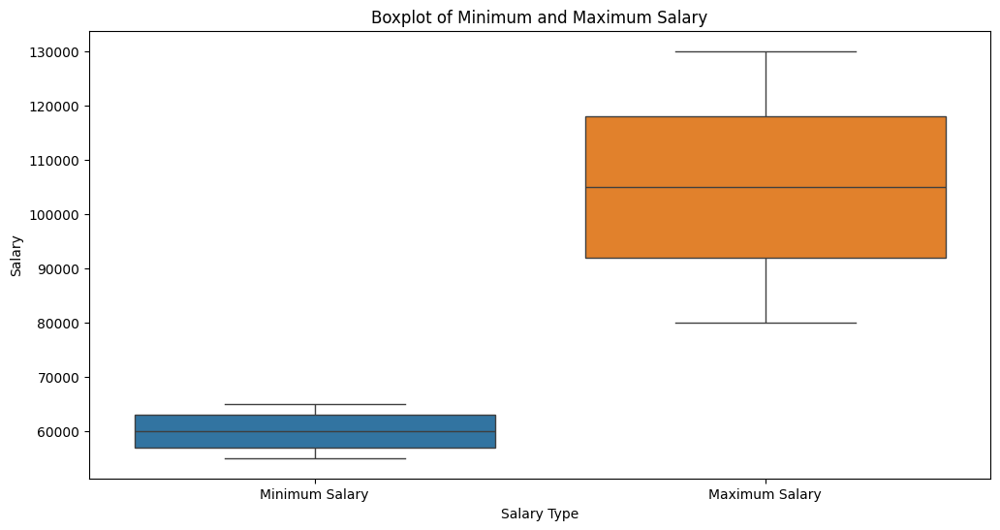

In [40]:
# Boxplot for Minimum and Maximum Salary
plt.figure(figsize=(12, 6))
sns.boxplot(data=df[['Minimum Salary', 'Maximum Salary']])
plt.title('Boxplot of Minimum and Maximum Salary')
plt.xlabel('Salary Type')
plt.ylabel('Salary')
plt.show()


A boxplot of the minimum and maximum salary reveals that the minimum salary for jobs is 60000 dollars yearly and has an interquatile range between 55000 and 65000 while the maximum salary is approximately 105000 with an interquatile range of 85000 and 125000.

#### Salary by Job Title

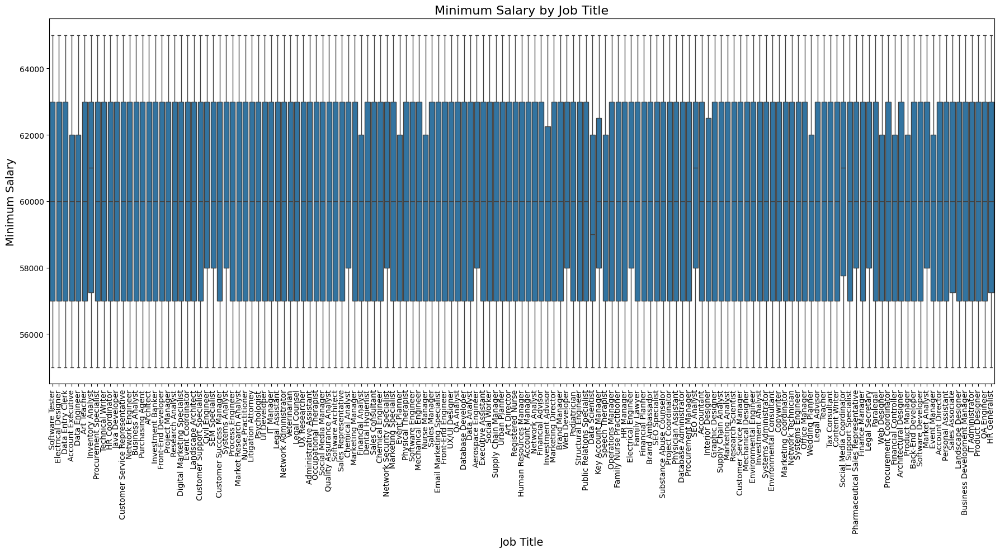

In [41]:
#Salary by Job Title
plt.figure(figsize=(18, 10))
sns.boxplot(x='Job Title', y='Minimum Salary', data=df)
plt.xticks(rotation=90)
plt.title('Minimum Salary by Job Title', fontsize=16)
plt.xlabel('Job Title', fontsize=14)
plt.ylabel('Minimum Salary', fontsize=14)
plt.tight_layout()
plt.show()


This is the distribution of the minimum salary for each job title. Each box plot includes information about the minimum, 25th percentile, median—50th percentile, 75th percentile, and maximum salary for a given job title. The plot can then be used in comparing salary distributions across different job titles and pointing out which of the job titles have abnormally high or low minimum salaries.

#### Correlation Analysis

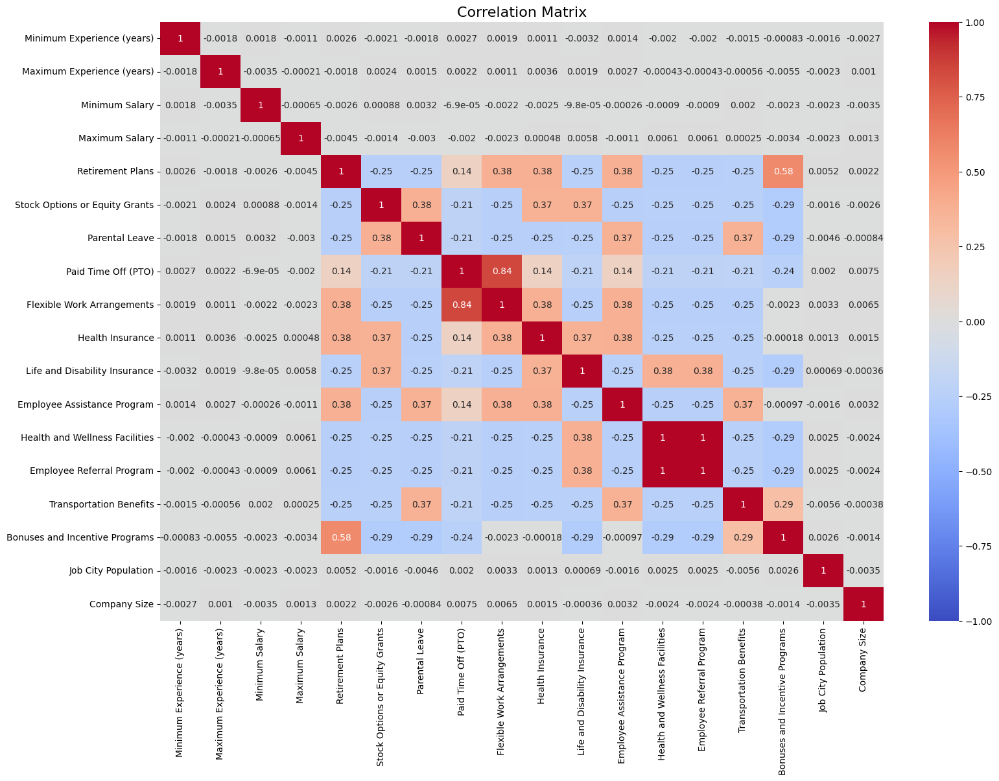

In [42]:
# Correlation Analysis
fields = [
    'Minimum Experience (years)', 'Maximum Experience (years)', 'Minimum Salary',
    'Maximum Salary', 'Retirement Plans', 'Stock Options or Equity Grants',
    'Parental Leave', 'Paid Time Off (PTO)', 'Flexible Work Arrangements',
    'Health Insurance', 'Life and Disability Insurance', 'Employee Assistance Program',
    'Health and Wellness Facilities', 'Employee Referral Program',
    'Transportation Benefits', 'Bonuses and Incentive Programs',
    'Job City Population', 'Company Size'
]

# Create the correlation matrix
correlation = df[fields].corr()

plt.figure(figsize=(18, 12))
sns.heatmap(correlation, annot=True, cmap='coolwarm', vmin=-1, vmax=1, annot_kws={"size": 10})
plt.title('Correlation Matrix', fontsize=16)
plt.show()

Key Positive Relationships: These could be indicative of a potential clustering of benefits often granted together, such as;
- flexible work arrangements with PTO and bonuses with retirement plans.
- Parental leave and stock options or equity grants
- Life and disability insurance and health insurance
- Bonuses and incentive programs and Transportation benefits

Key Negative Relationships: These could be indicative of possible trade-offs where certain benefits are less likely to co-exist, for example,
- bonuses with health insurance.
- flexible work arrangements and parental leave
- Parental leave and bonus and incentive programs
- Transportation benefits and paid time off

Salary and Experience Variables: These all show a relatively small amount of correlation with benefits, hence there may well be other factors at work in driving benefit packages more strongly.

Above is the heatmap that includes, for each of the selected fields against another, their correlation coefficients. These values are between –1 and 1, where the following holds:
* 1: Perfect positive correlation.
* -1 means perfect negative correlation.
* 0 indicates no relationship.

Positive relationships will be in 'hot' colours—reds—from the coolwarm colormaps, and negative correlations will be in cool colours—blues.

The cells in such a heatmap all boil down into some coefficient of correlation, thus quite easily distinguishing the intensity between fields into strong/weak. Such a plot will help identify exactly how the different attributes of jobs and benefits companies are related.

#### Impact of Benefits on Salary

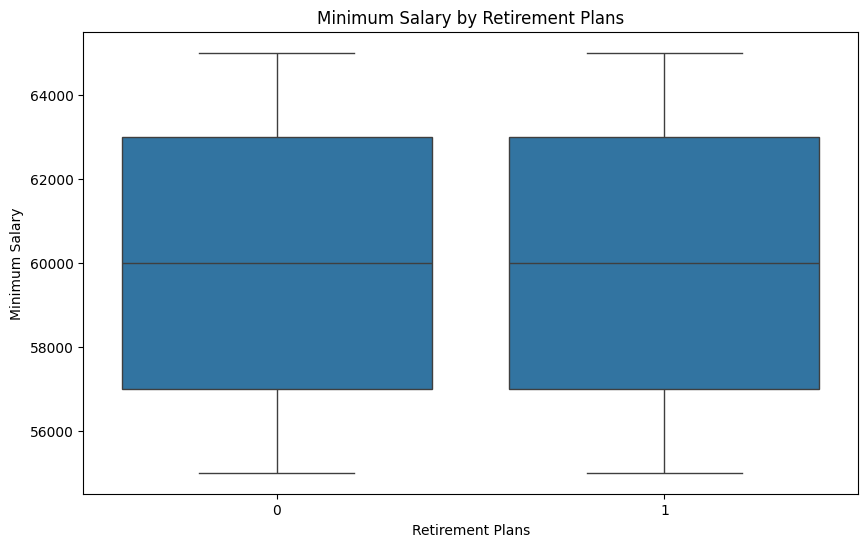

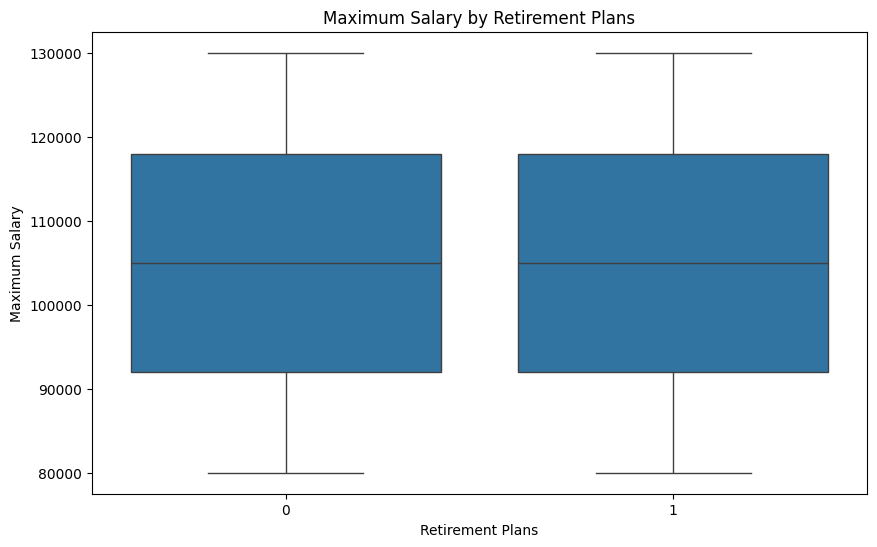

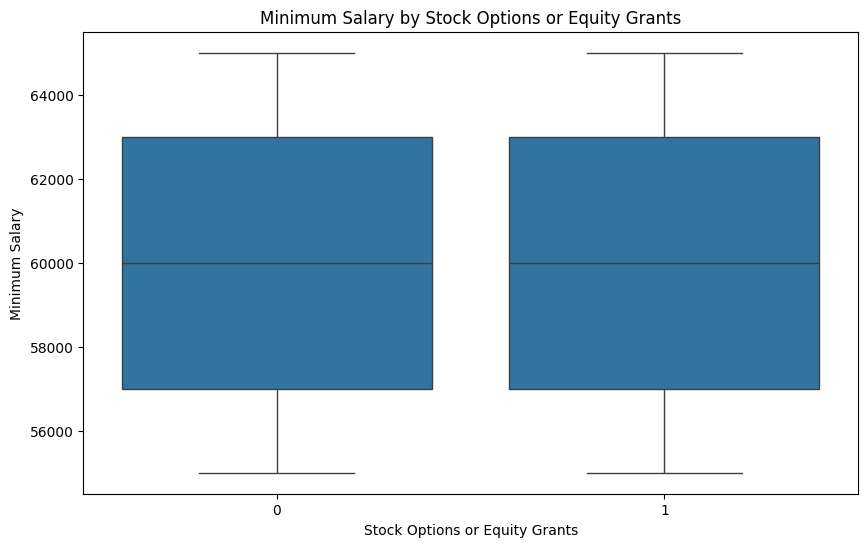

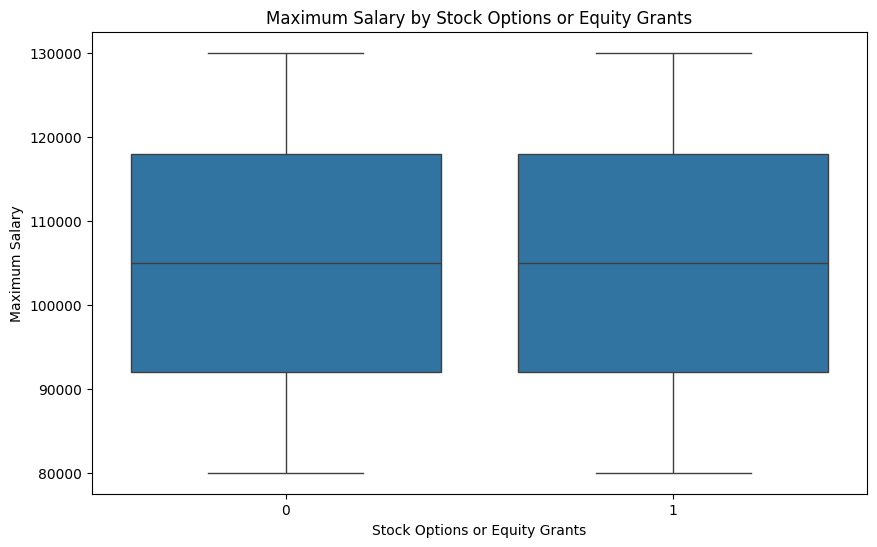

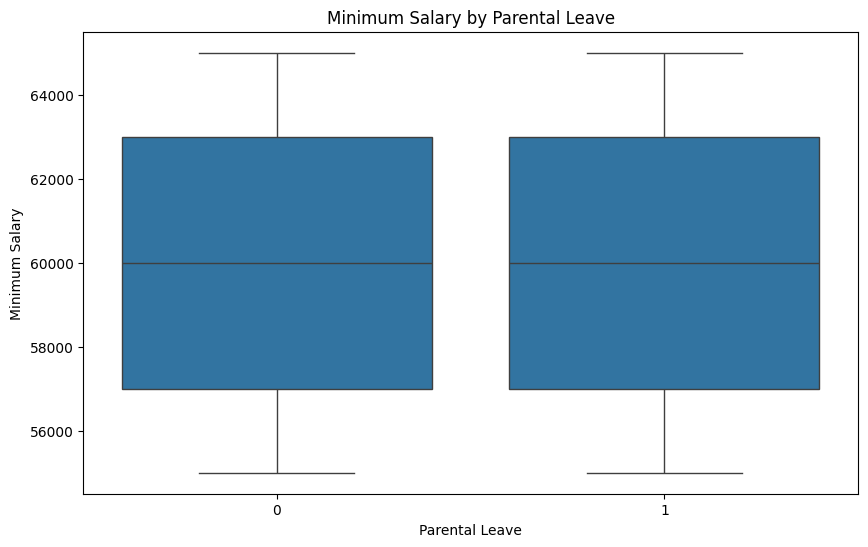

...

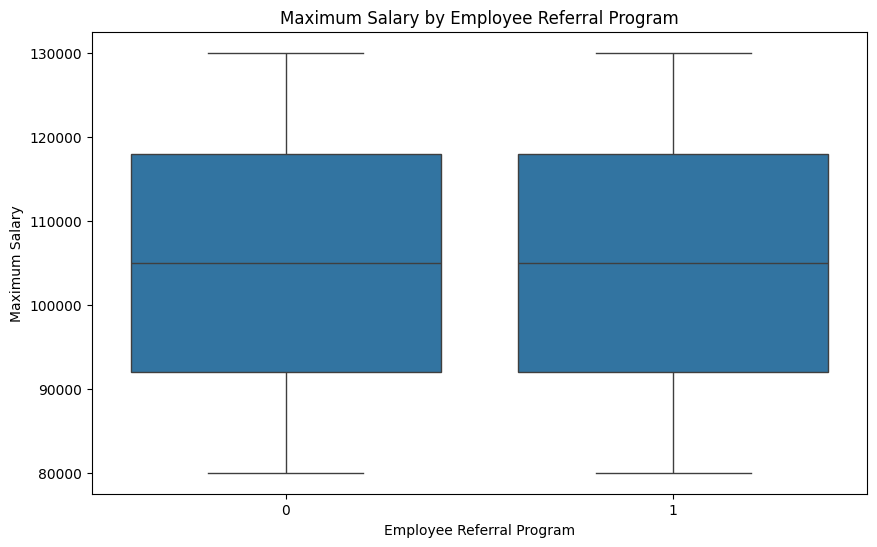

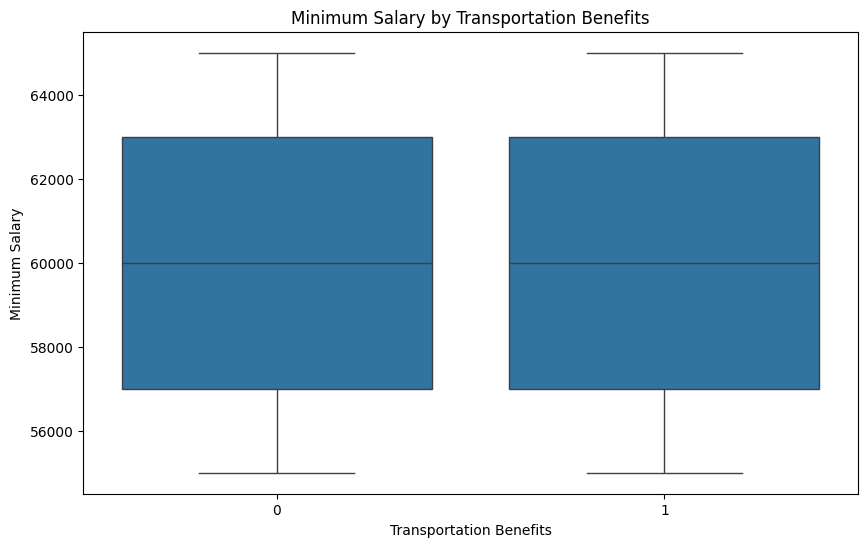

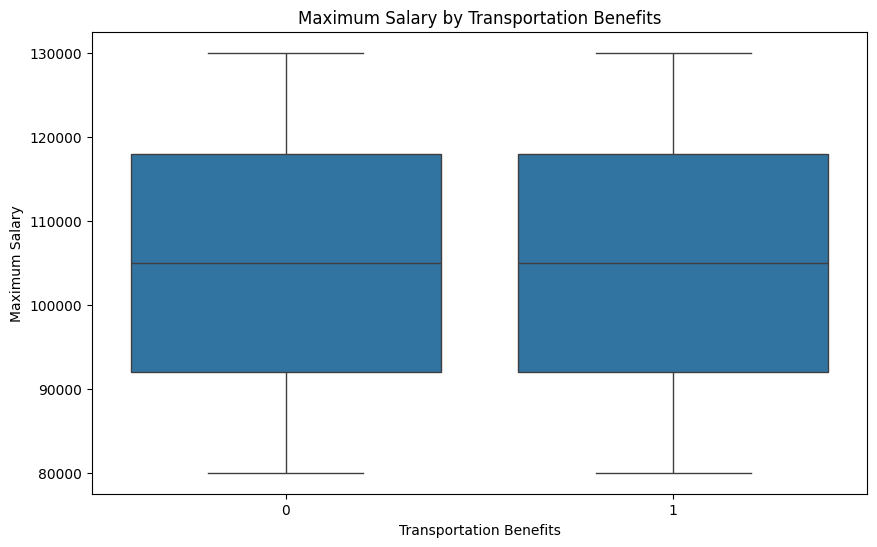

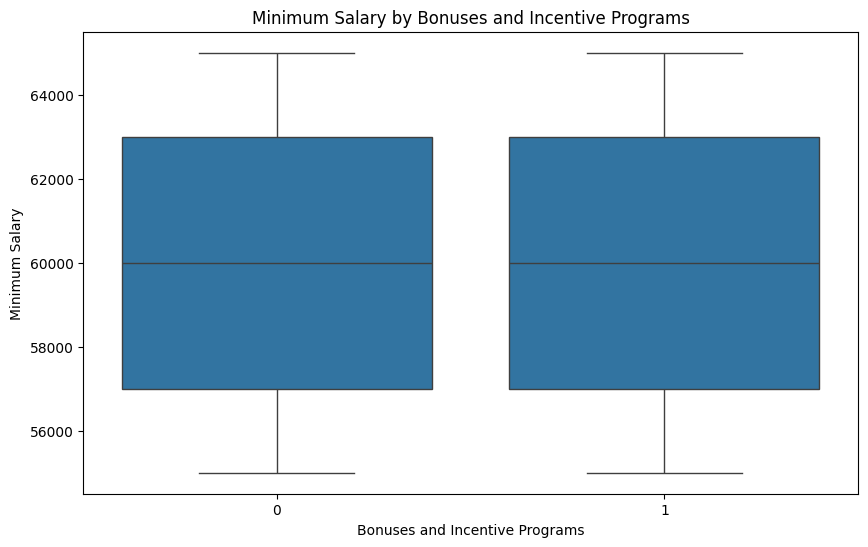

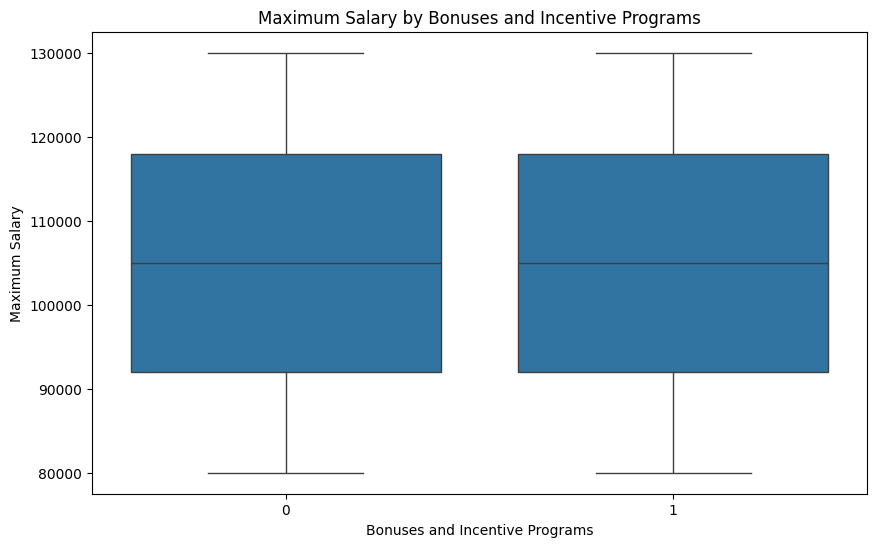

In [43]:
#Impact of Benefits on Salary
benefits = [
    'Retirement Plans', 'Stock Options or Equity Grants', 'Parental Leave',
    'Paid Time Off (PTO)', 'Flexible Work Arrangements', 'Health Insurance',
    'Life and Disability Insurance', 'Employee Assistance Program',
    'Health and Wellness Facilities', 'Employee Referral Program',
    'Transportation Benefits', 'Bonuses and Incentive Programs'
]

for benefit in benefits:
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=df, x=benefit, y='Minimum Salary')
    plt.title(f'Minimum Salary by {benefit}')
    plt.xlabel(benefit)
    plt.ylabel('Minimum Salary')
    plt.show()

    plt.figure(figsize=(10, 6))
    sns.boxplot(data=df, x=benefit, y='Maximum Salary')
    plt.title(f'Maximum Salary by {benefit}')
    plt.xlabel(benefit)
    plt.ylabel('Maximum Salary')
    plt.show()


These boxplots are the graphical representation used to compare the impact of various benefits on minimum and maximum salaries. Using these, we will come to know which benefits are related to higher values of salaries, which can help in understanding compensation trends and by which HR policy can be framed out.

The plots don't lie, suggesting similar salary distribution for both minimum and maximum salary, regardless of the presence or absence of various benefits that could indicate several points in this subset:
- Benefits Are Not a Key Salary Driver
- Standardized Salary Bands
- High Benefits Prevalence: If most jobs include these benefits, then the difference between the jobs including and not including these benefits would be less prominent and salary distributions would not show a significant difference.
- Poor Dataset: Another reason could be that the dataset itself is poor or biased. For instance, benefits might not vary greatly or there might be an imbalance in the number of jobs with and without certain benefits.
Among other possible factors.

#### Salary by City

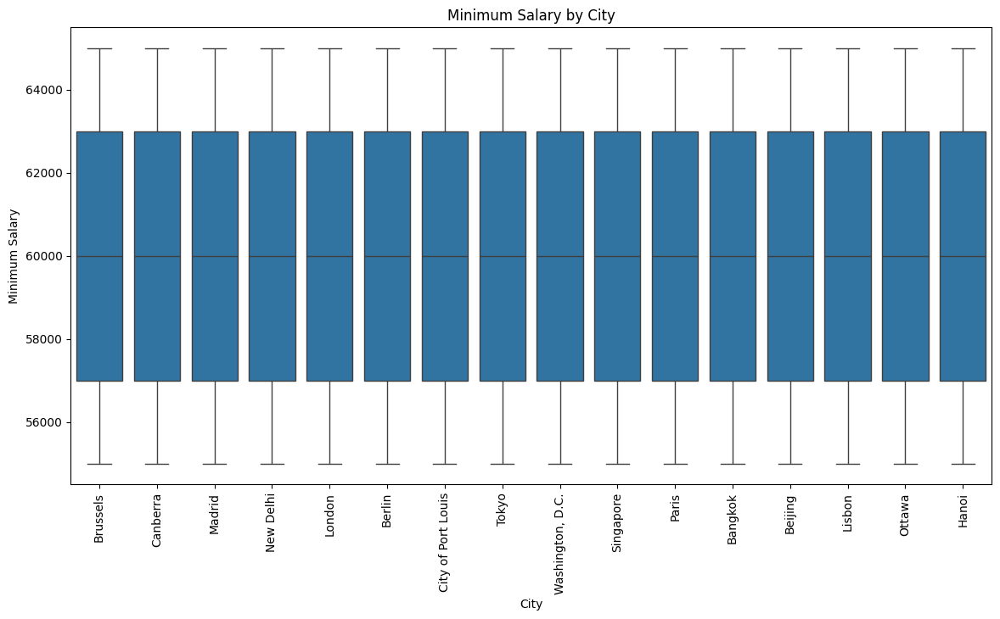

In [44]:
# Salary by City
plt.figure(figsize=(14, 7))
sns.boxplot(x='City', y='Minimum Salary', data=df)
plt.xticks(rotation=90)
plt.title('Minimum Salary by City')
plt.xlabel('City')
plt.ylabel('Minimum Salary')
plt.show()


The fact that all of the boxplots of minimum salary by city look about the same may suggest a number of different scenarios:
- Standardized Salary Policies: Businesses may be following company-wide standardized salary policies that are not radically different from one location to another. This could be due to corporate policies that ensure something close to a standard salary scale for particular job descriptions, irrespective of geographical areas.
- Cost of Living Adjustments: Either the cost of living variation between these cities is less or the companies give proper cost of living adjustments; therefore, the minimum salary comes out to be similar for all locations.
- Sample Bias: There may be bias in the data set as a result of the sample of jobs being too small to represent different cities, thus creating the illusion of consistent salaries.
- Remote Work: If remote work is the future, the physical location of a job becomes less relevant, so companies might offer a similar salary irrespective of the city.
- Homogeneous Labor Market: The labor market for the jobs in the dataset in these cities might be relatively homogeneous, which is therefore prompting similar salary offerings. This could be driven by similar dynamics of demand and supply in these cities.

#### Distribution of benefits

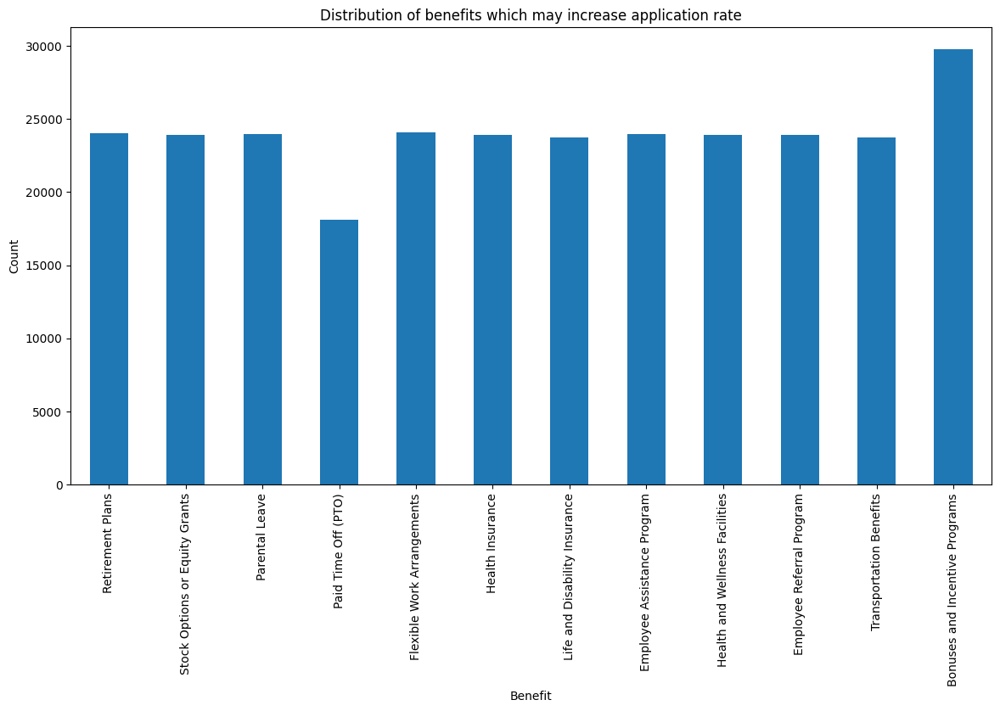

In [45]:
# Distribution of benefits
benefits_columns = ['Retirement Plans', 'Stock Options or Equity Grants', 'Parental Leave', 'Paid Time Off (PTO)',
                    'Flexible Work Arrangements', 'Health Insurance', 'Life and Disability Insurance',
                    'Employee Assistance Program', 'Health and Wellness Facilities', 'Employee Referral Program',
                    'Transportation Benefits', 'Bonuses and Incentive Programs']
df_benefits = df[benefits_columns]

df_benefits.sum().plot(kind='bar', figsize=(14, 7))
plt.title('Distribution of benefits which may increase application rate')
plt.xlabel('Benefit')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

A bar plot of the distribution of benefits suggests that the values are about the same for most of the benefits, although for "Bonuses and Incentive Programs" and "Paid Time Off" (PTO)", this stands out, and one may infer a number of critical implications as a result:

- Popularity of Bonuses and Incentive Programs: This higher count could indicate that among the jobs in your data set, these are among the most common benefits offered. It might be that due to employers offering more of this to attract talent and retain skill, they are thus perceived as holding value in incentivizing employees.

- Less Emphasis on Paid Time Off (PTO): The lower count for PTO does suggest that it is in fewer offerings compared to other benefits. It could also mean that companies do not find the PTO offer critical to luring applicants, or that it is offered in some other form, like flex or other leaves that are not represented under the same category.

- Market Trends and Employee Preference: Distribution can also be based on current market trends and employee preferences. One example of this is bonuses and incentive programs in a very competitive job market where employers are looking for innovative ways to differentiate their offerings and excite employees about their jobs over and above normal benefits.

- Industry Standards: This could also be reflecting industry standards. There may be certain industries where norms have been established to provide particular benefits, in which bonus and incentive programs would become an important part of the pay package.

#### Distribution of Job Listings by Job Portal

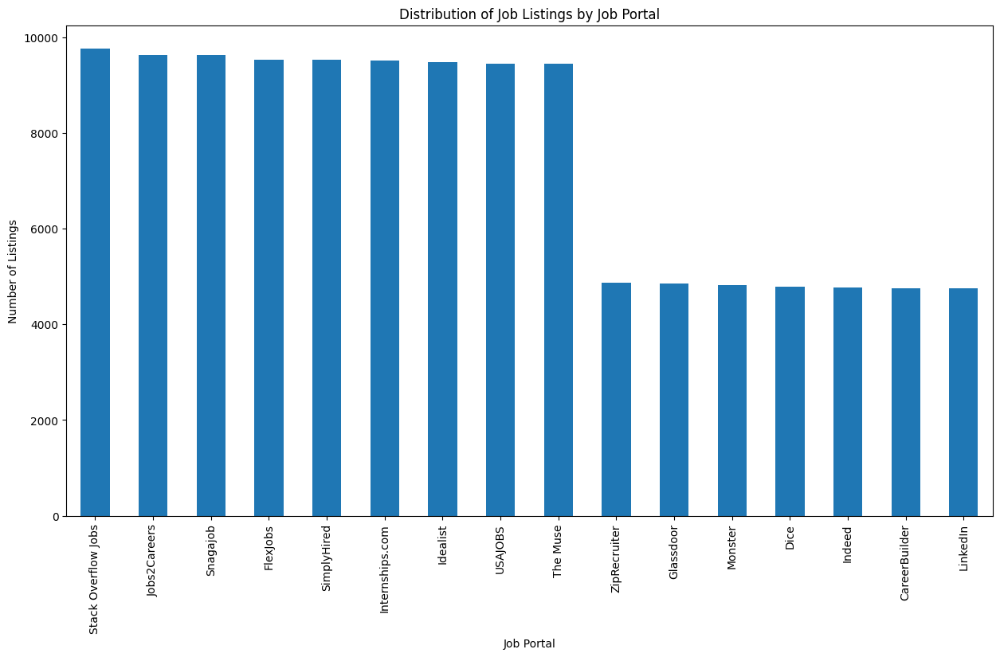

In [46]:
#Distribution of Job Listings by Job Portal
job_portal_distribution = df['Job Portal'].value_counts()
plt.figure(figsize=(15, 8))
job_portal_distribution.plot(kind='bar')
plt.title('Distribution of Job Listings by Job Portal')
plt.xlabel('Job Portal')
plt.ylabel('Number of Listings')
plt.show()


A bar plot of the distribution of job listings by job portal shows the different portals with the most job listing. The far right has relatively lower job listing of about 5000. This include portals like LinkedIn, indeed, Dice, ZipRecruiter, while the far left consisting of portals like The Muse, Stack Overflow jobs etc have relatively higher job listings of approximately 10000.

#### Popularity of Job Titles by Country

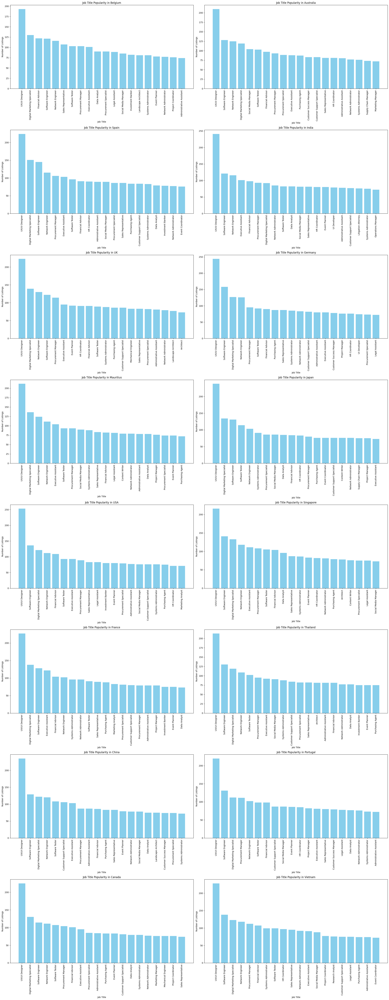

In [47]:
#Popularity of Job Titles by Country
# Get unique countries
countries = df['Country'].unique()

# Set the number of columns for subplots
n_cols = 2
n_rows = -(-len(countries) // n_cols)


fig, axes = plt.subplots(n_rows, n_cols, figsize=(25, 8 * n_rows))
axes = axes.flatten()

for i, country in enumerate(countries):
    country_data = df[df['Country'] == country]['Job Title'].value_counts().head(20)
    axes[i].bar(country_data.index, country_data.values, color='skyblue')
    axes[i].set_title(f'Job Title Popularity in {country}')
    axes[i].set_xlabel('Job Title')
    axes[i].set_ylabel('Number of Listings')
    axes[i].tick_params(axis='x', rotation=90)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


The bar chart above gives insights into the global and local job market trends, and better understand how job title popularity varies across different countries.

Accross the 16 represented countries, the most popular job title is UI/UX designer.
This may mean various things;
- There is a high demand for UI/UX designers
- This could also be attributed to the technology inductry growth
- And also the fact that many companies now are focusing on user experience to satisfy their customers.
- It could also be attributed to potential skill shortage in UI/UX industry.

#### Correlation Matrix for common factors per job affecting application rate

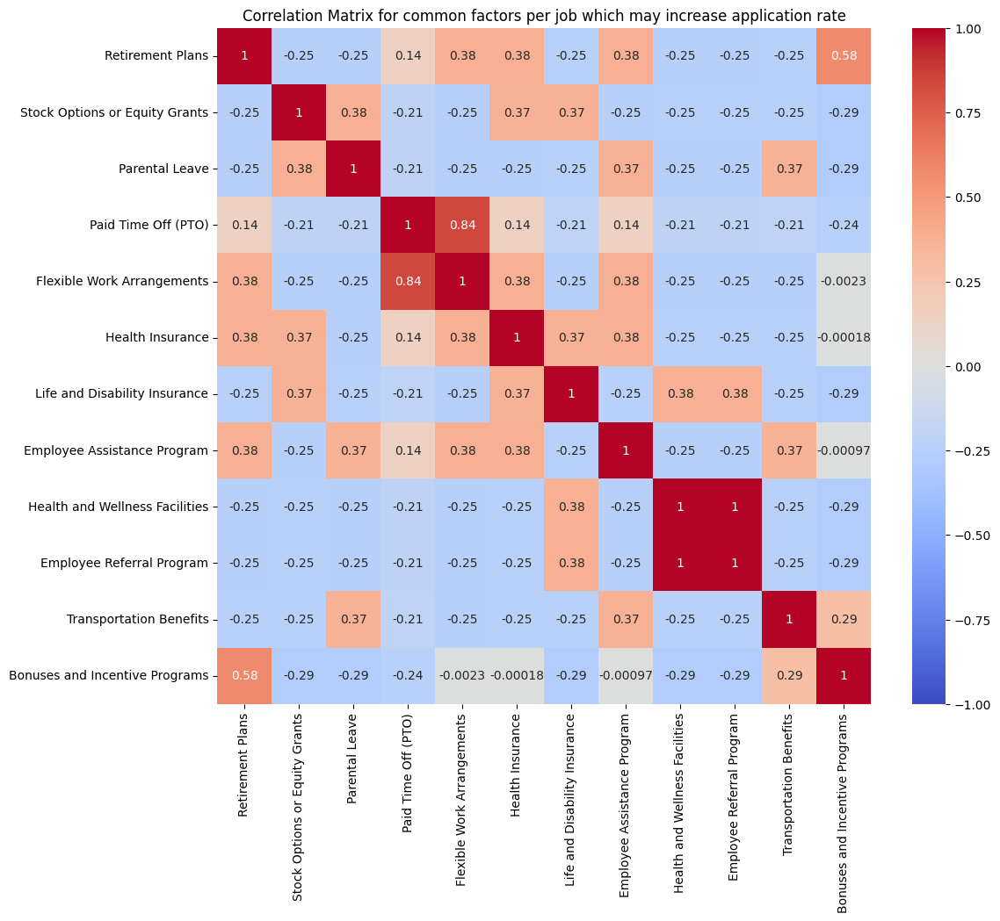

In [48]:
#Correlation Matrix for common factors per job, which may increase the application rate
correlation = df[['Retirement Plans', 'Stock Options or Equity Grants', 'Parental Leave', 'Paid Time Off (PTO)',
                  'Flexible Work Arrangements', 'Health Insurance', 'Life and Disability Insurance',
                  'Employee Assistance Program', 'Health and Wellness Facilities', 'Employee Referral Program',
                  'Transportation Benefits', 'Bonuses and Incentive Programs']].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix for common factors per job which may increase application rate')
plt.show()

Key Positive Relationships: These could be indicative of a potential clustering of benefits often granted together, such as;
- flexible work arrangements with PTO and bonuses with retirement plans.
- Parental leave and stock options or equity grants
- Life and disability insurance and health insurance
- Bonuses and incentive programs and Transportation benefits

Key Negative Relationships: These could be indicative of possible trade-offs where certain benefits are less likely to co-exist, for example,
- bonuses with health insurance.
- flexible work arrangements and parental leave
- Parental leave and bonus and incentive programs
- Transportation benefits and paid time off

Salary and Experience Variables: These all show a relatively small amount of correlation with benefits, hence there may well be other factors at work in driving benefit packages more strongly.

#### Work Type against salary per country

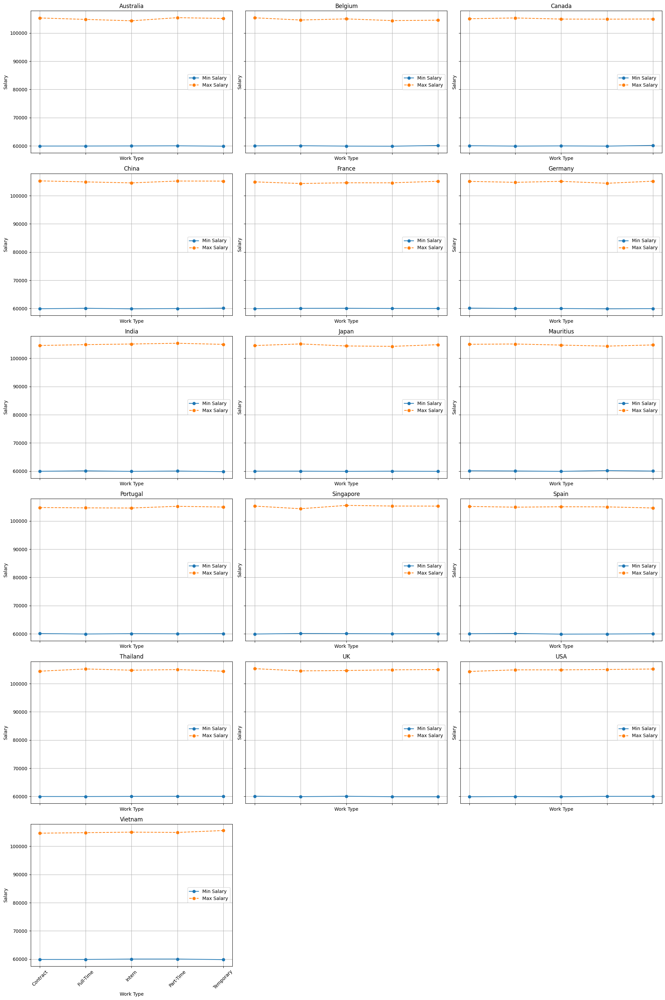

In [49]:
# Group by Country and Work Type, and calculate mean salaries
country_work_salary = df.groupby(['Country', 'Work Type']).agg({
    'Minimum Salary': 'mean',
    'Maximum Salary': 'mean'
}).reset_index()

# Get unique countries
countries = country_work_salary['Country'].unique()

# Set up the matplotlib figure
n_cols = 3  # Number of columns for the subplots
n_rows = -(-len(countries) // n_cols)  # Calculate number of rows needed
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows), sharex=True, sharey=True)
axes = axes.flatten()  # Flatten the array of axes for easy iteration

# Plot lines for each country
for i, country in enumerate(countries):
    country_data = country_work_salary[country_work_salary['Country'] == country]
    ax = axes[i]
    ax.plot(country_data['Work Type'], country_data['Minimum Salary'], marker='o', label='Min Salary')
    ax.plot(country_data['Work Type'], country_data['Maximum Salary'], marker='o', linestyle='--', label='Max Salary')
    ax.set_title(f'{country}')
    ax.set_xlabel('Work Type')
    ax.set_ylabel('Salary')
    ax.tick_params(axis='x', rotation=45)
    ax.legend()
    ax.grid(True)

# Hide any unused subplots
for j in range(len(countries), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

These line plots will help us understand salary trends for different work types across various countries, providing insights into how salaries vary by job type and location.Based on the graphs presented, minimum salary is same based on

#### Popularity of jobs and salary ranges for top ten jobs in all countries

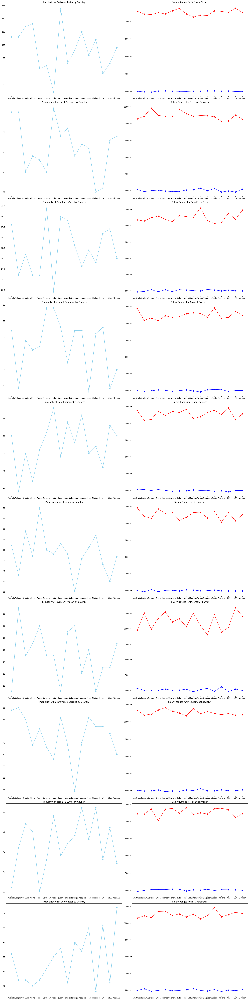

In [50]:
job_titles = df['Job Title'].unique()[:10]  # Keep the top 10 job titles

# Calculate number of subplots needed to display all plots
n_plots = len(job_titles) * 2
n_cols = 2
n_rows = (n_plots + n_cols - 1) // n_cols

# Create subplots with enough space for all plots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 8 * n_rows))
axes = axes.flatten()

for i, job in enumerate(job_titles):
    job_data = df[df['Job Title'] == job]

    # Aggregate data for plotting (unchanged)
    country_salary_data = job_data.groupby('Country').agg({
        'Minimum Salary': 'mean',
        'Maximum Salary': 'mean',
        'Job Title': 'count'
    }).rename(columns={'Job Title': 'Job Listings'}).reset_index()

    # Plot popularity of job titles by country
    axes[i * 2].plot(country_salary_data['Country'], country_salary_data['Job Listings'], marker='o', color='skyblue', label='Job Listings')
    axes[i * 2].set_title(f'Popularity of {job} by Country')
    # ... (rest of the plot formatting)

    # Plot minimum and maximum salary
    axes[i * 2 + 1].plot(country_salary_data['Country'], country_salary_data['Minimum Salary'], marker='o', label='Minimum Salary', color='blue')
    axes[i * 2 + 1].plot(country_salary_data['Country'], country_salary_data['Maximum Salary'], marker='o', label='Maximum Salary', color='red')
    axes[i * 2 + 1].set_title(f'Salary Ranges for {job}')
    # ... (rest of the plot formatting)

# Remove any extra empty subplots to ensure proper display and spacing
for j in range(len(job_titles) * 2, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

Each plot titled "Popularity of Job Title by Country" contains the total job listing count for that particular job title based in different countries. This would convey to us where the demand is highest for each job title.   

Each plot titled "Salary Ranges for Job Title" contains the minimum and maximum average salary for that particular job title across different countries. It provides insights regarding salary expectations for certain job titles in other regions.

In [51]:
#pip install wordcloud

#### Common Skills in job posting per country

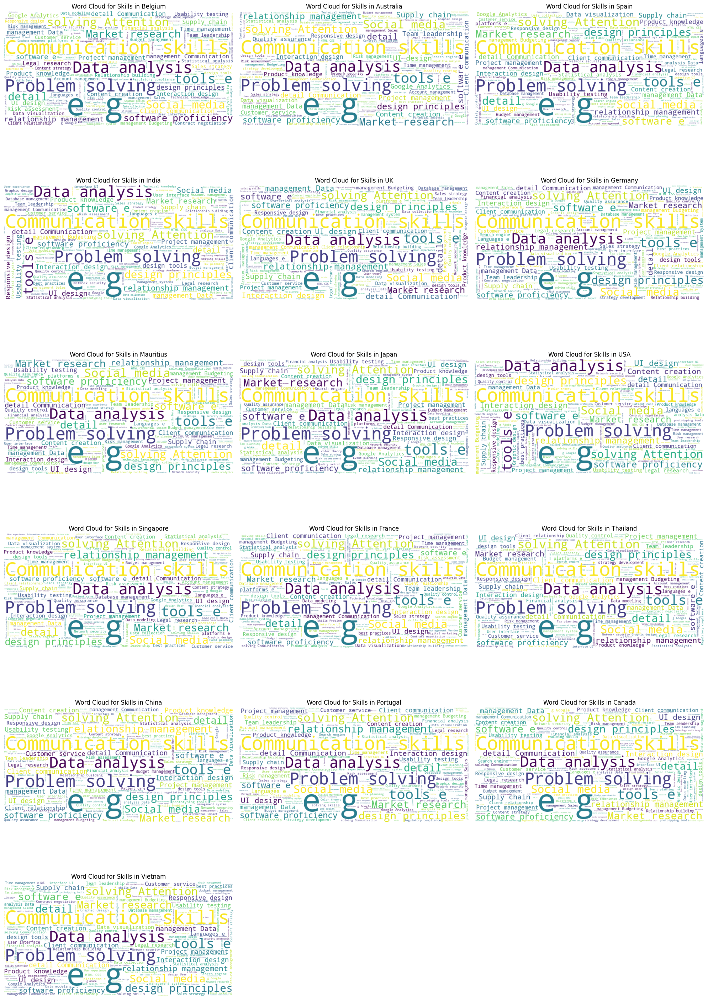

In [52]:
from wordcloud import WordCloud
countries = df['Country'].unique()
n_countries = len(countries)
n_cols = 3
n_rows = -(-n_countries // n_cols) 

plt.figure(figsize=(20, 5 * n_rows))

# Generate a word cloud for each country
for i, country in enumerate(countries):
    # Filter the dataset for the specific country
    country_data = df[df['Country'] == country]['Skills'].dropna()

    # Join all skills into a single string
    all_skills = ' '.join(country_data)

    # Generate the word cloud
    wordcloud = WordCloud(width=800, height=400, random_state=21, max_font_size=110, background_color='white').generate(all_skills)

    # Plot the word cloud
    plt.subplot(n_rows, n_cols, i + 1)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for Skills in {country}')

# Adjust layout and display
plt.tight_layout()
plt.show()


Each subplot in the resulting figure corresponds to a word cloud for the skills listed in job postings for a country. In each word cloud:

Words that appear more frequently in the skill lists of the job postings are in larger and bolder text.
Less common words are shown in smaller and lighter text.

These word clouds allow for quick identification of the most in-demand skills in the job ads of each country. This gives a clearer picture of regional trends and demands in skills, thus helping to answer questions concerning which type of skills are actually valuable within different job markets.

#### Common Qualification per country

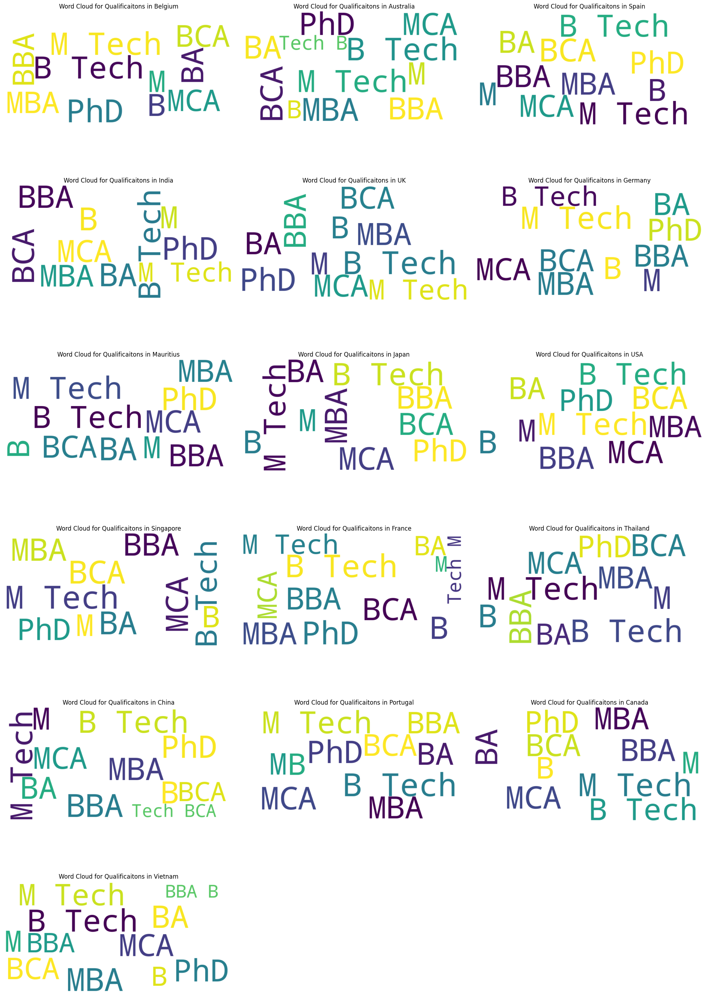

In [53]:
countries = df['Country'].unique()
n_countries = len(countries)
n_cols = 3
n_rows = -(-n_countries // n_cols)  # Calculate number of rows needed

plt.figure(figsize=(20, 5 * n_rows))

# Generate a word cloud for each country
for i, country in enumerate(countries):
    # Filter the dataset for the specific country
    country_data = df[df['Country'] == country]['Qualifications'].dropna()

    # Join all skills into a single string
    all_skills = ' '.join(country_data)

    # Generate the word cloud
    wordcloud = WordCloud(width=800, height=400, random_state=21, max_font_size=110, background_color='white').generate(all_skills)

    # Plot the word cloud
    plt.subplot(n_rows, n_cols, i + 1)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for Qualificaitons in {country}')

# Adjust layout and display
plt.tight_layout()
plt.show()


The following figure includes for each country a word cloud of the qualifications in job postings.

We could get a quick feel for what the most common qualifications for job postings are in each country. It will give a view of regional qualification demands and trends, helping us understand which qualifications are most valued in different job markets.

#### Ngram exploration of top skills per country

In [54]:
from sklearn.feature_extraction.text import CountVectorizer
def get_top_ngram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(n, n)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return words_freq[:10]



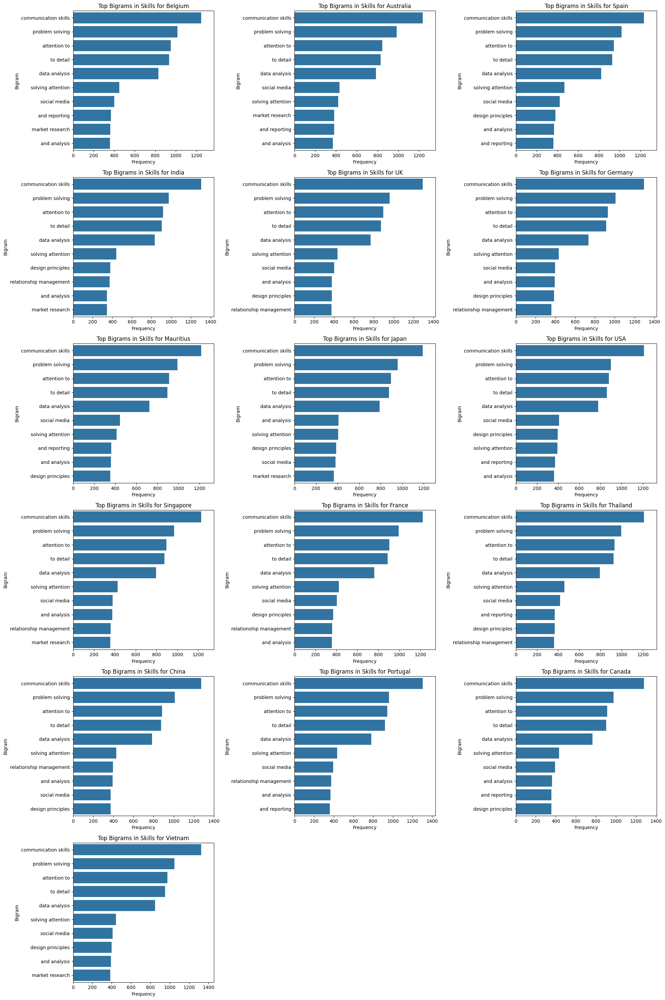

In [55]:
# Create a plot for each country
countries = df['Country'].unique()
n_cols = 3
n_rows = -(-len(countries) // n_cols)  # Calculate number of rows needed

plt.figure(figsize=(20, 5 * n_rows))

for i, country in enumerate(countries):
    # Filter the dataset for the specific country
    country_data = df[df['Country'] == country]

    # Join all skills into a single string
    all_skills = ' '.join(country_data['Skills'].dropna())

    # Get top bigrams
    top_n_bigrams = get_top_ngram([all_skills], 2)[:20]
    x, y = map(list, zip(*top_n_bigrams))

    # Plot the bigrams
    plt.subplot(n_rows, n_cols, i + 1)
    sns.barplot(x=y, y=x)
    plt.title(f'Top Bigrams in Skills for {country}')
    plt.xlabel('Frequency')
    plt.ylabel('Bigram')
    plt.xlim(0, max(y) * 1.1)  # Adjust x-axis limit based on frequency

# Adjust layout and display
plt.tight_layout()
plt.show()

We can quickly identify common pairs of skills that frequently appear together in job postings for each country. This can provide insights into the specific skill sets that are in high demand in different job markets, helping to understand regional differences in skill requirements.

We can realise that the most valuable skill to have in all the countries is communication skills and problem solving.

#### Ngram analysis of highest qualification sought after per country

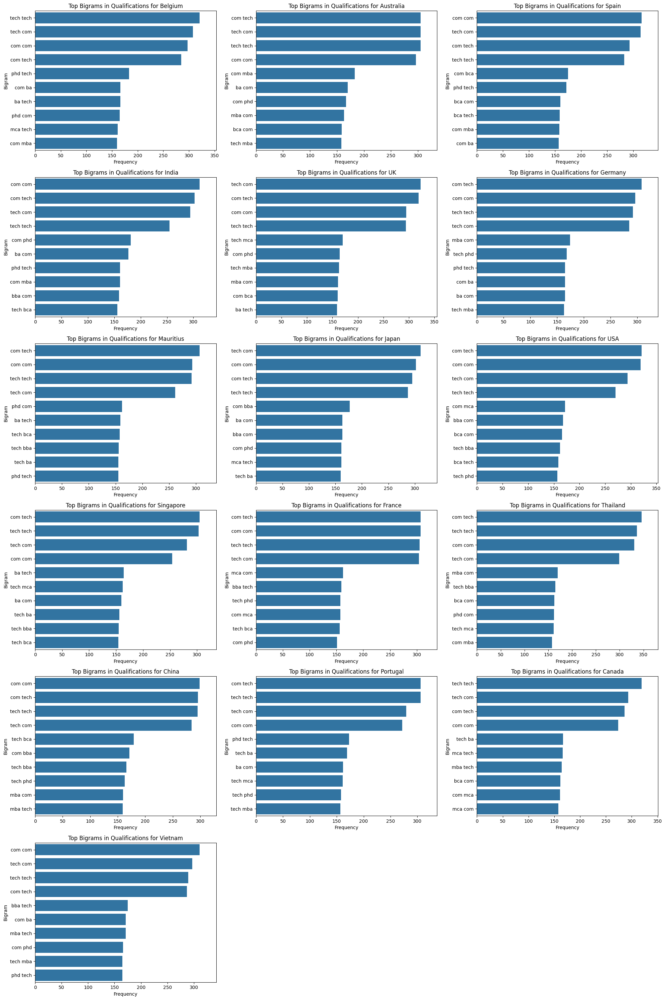

In [56]:
# Create a plot for each country
countries = df['Country'].unique()
n_cols = 3
n_rows = -(-len(countries) // n_cols)  # Calculate number of rows needed

plt.figure(figsize=(20, 5 * n_rows))

for i, country in enumerate(countries):
    # Filter the dataset for the specific country
    country_data = df[df['Country'] == country]

    # Join all Qualifications into a single string
    all_Qualifications = ' '.join(country_data['Qualifications'].dropna())

    # Get top bigrams
    top_n_bigrams = get_top_ngram([all_Qualifications], 2)[:20]
    x, y = map(list, zip(*top_n_bigrams))

    # Plot the bigrams
    plt.subplot(n_rows, n_cols, i + 1)
    sns.barplot(x=y, y=x)
    plt.title(f'Top Bigrams in Qualifications for {country}')
    plt.xlabel('Frequency')
    plt.ylabel('Bigram')
    plt.xlim(0, max(y) * 1.1)  # Adjust x-axis limit based on frequency

# Adjust layout and display
plt.tight_layout()
plt.show()

Through these bars, we can gain insights into the common qualifications required in different countries. This can help identify regional trends in job qualifications, revealing which skill combinations are most in demand in various job markets.

#### Analysis of qualification against salary range and experience ranges

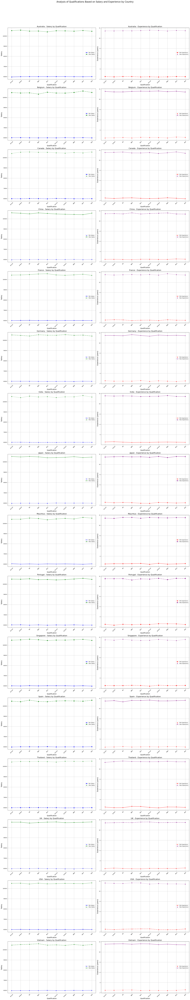

In [57]:
# Get top 10 qualifications based on the number of job listings
top_qualifications = df['Qualifications'].value_counts().head(10).index

# Filter the dataset to include only the top 10 qualifications
top_qualification_data = df[df['Qualifications'].isin(top_qualifications)]

# Group by Country and Qualifications, and calculate mean salaries and experiences
qualification_stats = top_qualification_data.groupby(['Country', 'Qualifications']).agg({
    'Minimum Salary': 'mean',
    'Maximum Salary': 'mean',
    'Minimum Experience (years)': 'mean',
    'Maximum Experience (years)': 'mean'
}).reset_index()

# Get unique countries
countries = qualification_stats['Country'].unique()

# Set up the matplotlib figure with increased size
fig, axes = plt.subplots(len(countries), 2, figsize=(24, len(countries) * 8))
fig.suptitle('Analysis of Qualifications Based on Salary and Experience by Country', fontsize=20)

# Define marker styles and line styles
markers = ['o', 's', 'D', '^', 'v', '>', '<', 'p', '*', 'X']
line_styles = ['-', '--', '-.', ':', '-', '--', '-.', ':', '-', '--']

# Plot lines for each country
for i, country in enumerate(countries):
    country_data = qualification_stats[qualification_stats['Country'] == country]

    # Plot salary ranges
    axes[i, 0].plot(country_data['Qualifications'], country_data['Minimum Salary'], marker=markers[i % len(markers)], linestyle=line_styles[i % len(line_styles)], label='Min Salary', color='blue')
    axes[i, 0].plot(country_data['Qualifications'], country_data['Maximum Salary'], marker=markers[(i + 1) % len(markers)], linestyle=line_styles[(i + 1) % len(line_styles)], label='Max Salary', color='green')
    axes[i, 0].set_title(f'{country} - Salary by Qualification', fontsize=16)
    axes[i, 0].set_xlabel('Qualification', fontsize=14)
    axes[i, 0].set_ylabel('Salary', fontsize=14)
    axes[i, 0].legend()
    axes[i, 0].tick_params(axis='x', rotation=45)
    axes[i, 0].grid(True)

    # Plot experience ranges
    axes[i, 1].plot(country_data['Qualifications'], country_data['Minimum Experience (years)'], marker=markers[(i + 2) % len(markers)], linestyle=line_styles[(i + 2) % len(line_styles)], label='Min Experience', color='red')
    axes[i, 1].plot(country_data['Qualifications'], country_data['Maximum Experience (years)'], marker=markers[(i + 3) % len(markers)], linestyle=line_styles[(i + 3) % len(line_styles)], label='Max Experience', color='purple')
    axes[i, 1].set_title(f'{country} - Experience by Qualification', fontsize=16)
    axes[i, 1].set_xlabel('Qualification', fontsize=14)
    axes[i, 1].set_ylabel('Experience (years)', fontsize=14)
    axes[i, 1].legend()
    axes[i, 1].tick_params(axis='x', rotation=45)
    axes[i, 1].grid(True)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

On the first column for each country are the different subplots that indicate the mean minimum and maximum salaries for the top 10 qualifications.
This will help to identify qualifications that have higher salary ranges and the range of salary for each qualification.

Each plot in the second column per country in the second column also includes a bar chart of the average minimum and maximum experience requirements for top 10 qualifications.
This will tell which qualification requires more experience and what range of years is possessed by each qualification.

Qualification per experience range analysis

<Figure size 1400x800 with 0 Axes>

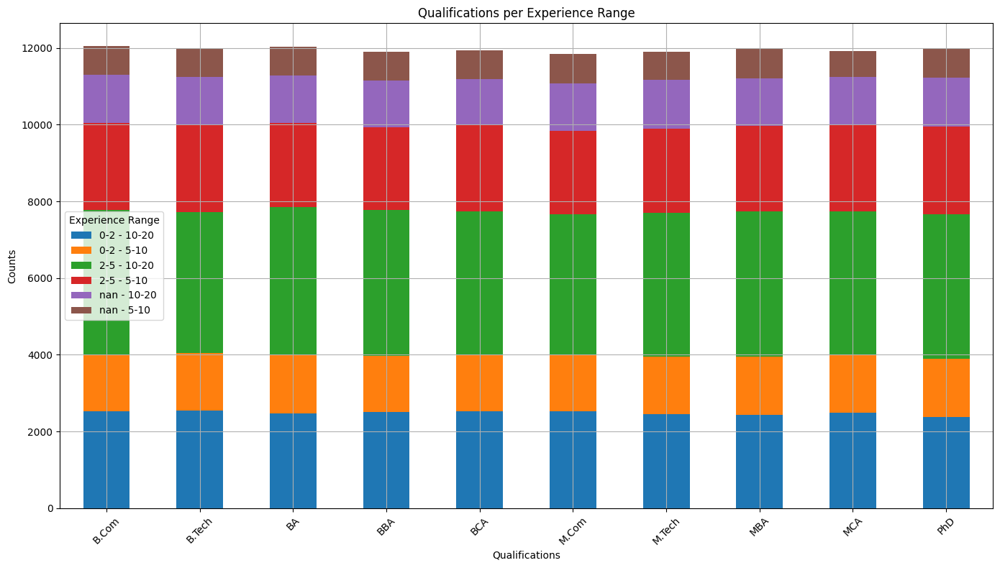

In [58]:
# Create experience range categories
df['Experience Range'] = pd.cut(df['Minimum Experience (years)'], bins=[0, 2, 5, 10, 20, 30, 40], labels=['0-2', '2-5', '5-10', '10-20', '20-30', '30-40'])
df['Experience Range Max'] = pd.cut(df['Maximum Experience (years)'], bins=[0, 2, 5, 10, 20, 30, 40], labels=['0-2', '2-5', '5-10', '10-20', '20-30', '30-40'])

# Combine the experience range categories
df['Experience Range Combined'] = df[['Experience Range', 'Experience Range Max']].apply(lambda x: f'{x[0]} - {x[1]}', axis=1)

# Group by Qualifications and Combined Experience Ranges, and count occurrences
experience_qualification_stats = df.groupby(['Qualifications', 'Experience Range Combined']).size().reset_index(name='Counts')

# Plot the results
plt.figure(figsize=(14, 8))
experience_qualification_pivot = experience_qualification_stats.pivot(index='Qualifications', columns='Experience Range Combined', values='Counts')
experience_qualification_pivot.plot(kind='bar', stacked=True, figsize=(14, 8))
plt.title('Qualifications per Experience Range')
plt.xlabel('Qualifications')
plt.ylabel('Counts')
plt.legend(title='Experience Range')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

This visualization will give us insight into the relationship between qualifications and their required levels of experience. It identifies the qualification that is linked to lower or high experience requirements, how diverse the range of experience may be within a qualification, and possible trends or patterns in job market demand related to qualification and experience. Some of the possible insights that could be gained are:
• Some will have a bigger proportion of higher experience ranges, indicating a clear preference for more senior candidates in the related areas.
• Others will be more evenly distributed across experience ranges, indicating flexibility in the hiring criteria.

#### Qualification per Salary Range

<Figure size 1400x800 with 0 Axes>

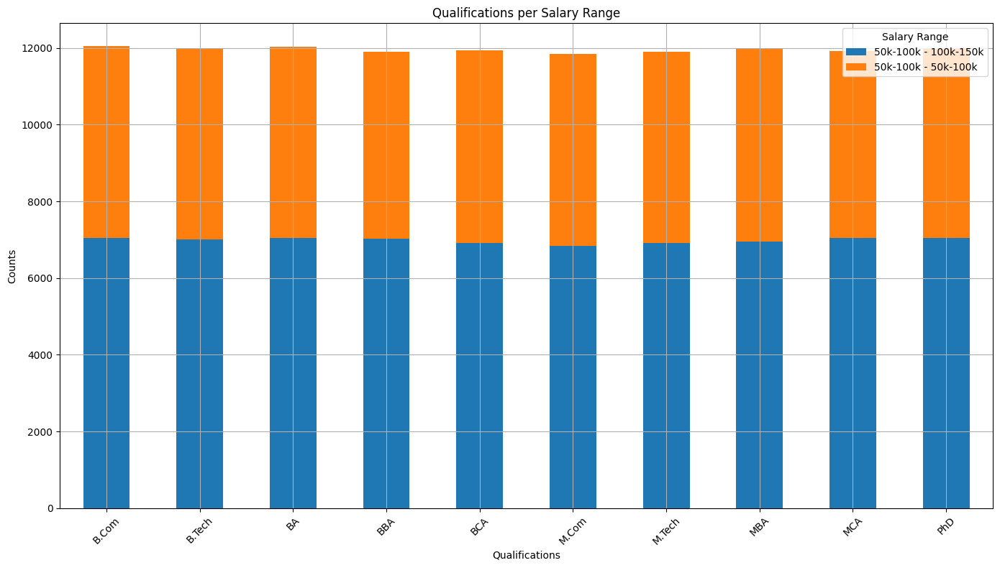

In [59]:
# Create salary range categories
df['Salary Range'] = pd.cut(df['Minimum Salary'], bins=[0, 50000, 100000, 150000, 200000, 250000, 300000], labels=['0-50k', '50k-100k', '100k-150k', '150k-200k', '200k-250k', '250k-300k'])
df['Salary Range Max'] = pd.cut(df['Maximum Salary'], bins=[0, 50000, 100000, 150000, 200000, 250000, 300000], labels=['0-50k', '50k-100k', '100k-150k', '150k-200k', '200k-250k', '250k-300k'])

# Combine the salary range categories
df['Salary Range Combined'] = df[['Salary Range', 'Salary Range Max']].apply(lambda x: f'{x[0]} - {x[1]}', axis=1)

# Group by Qualifications and Combined Salary Ranges, and count occurrences
salary_qualification_stats = df.groupby(['Qualifications', 'Salary Range Combined']).size().reset_index(name='Counts')

# Plot the results
plt.figure(figsize=(14, 8))
salary_qualification_pivot = salary_qualification_stats.pivot(index='Qualifications', columns='Salary Range Combined', values='Counts')
salary_qualification_pivot.plot(kind='bar', stacked=True, figsize=(14, 8))
plt.title('Qualifications per Salary Range')
plt.xlabel('Qualifications')
plt.ylabel('Counts')
plt.legend(title='Salary Range')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


Some of these qualifications may be predominantly required at higher salary ranges, thus showing higher compensation for certain skills or education levels.
On the other hand, some other qualifications may be represented more broadly across salary ranges, indicating flexibility in payment based on experience or other such factors.

#### T-Test: Comparing Average Minimum and Maximum Salaries by Country

In [61]:
country1 = df[df['Country'] == 'USA']
country2 = df[df['Country'] == 'Canada']

# T-test for Minimum Salary
t_stat, p_value = ttest_ind(country1['Minimum Salary'], country2['Minimum Salary'], nan_policy='omit')
print(f'T-Test for Minimum Salary between USA and Canada: t-stat={t_stat}, p-value={p_value}')

# T-test for Maximum Salary
t_stat, p_value = ttest_ind(country1['Maximum Salary'], country2['Maximum Salary'], nan_policy='omit')
print(f'T-Test for Maximum Salary between USA and Canada: t-stat={t_stat}, p-value={p_value}')


T-Test for Minimum Salary between USA and Canada: t-stat=-0.4995749593893975, p-value=0.6173818268695221
T-Test for Maximum Salary between USA and Canada: t-stat=-0.7922901331204821, p-value=0.42820423457659706


For Minimum Salaries:

- A t-statistic of -0.4996 is close to 0, pointing out that the minimum salaries between USA and Canada are very close.
- With a p-value of 0.6174, well above common significance levels like 0.05, technically, no statistically significant difference in the minimum salary rate between the two nations exists.

For Maximum Salaries:
- The t-statistic of -0.7923 also points out small differences in maximum salaries between USA and Canada.
- The corresponding p-value of 0.4282 is also higher than the common significance level. This thus implies that there is no significant difference in maximum salary between the two countries.

There is, hence, no evidence to show that either the minimum or maximum salary is significantly different between the USA and Canada in your data.

#### ANOVA: Comparing Salaries Across Multiple Countries

In [62]:
countries_to_compare = [
    'USA', 'UK', 'Canada', 'France', 'Belgium', 'Australia',
    'Spain', 'India', 'Germany', 'Singapore', 'Thailand',
    'China', 'Portugal', 'Vietnam', 'Mauritius', 'Japan'
]

# Extracting the salary data for each country
salary_data = [df[df['Country'] == country]['Minimum Salary'].dropna() for country in countries_to_compare]

# ANOVA for Minimum Salary
f_stat, p_value = f_oneway(*salary_data)
print(f'ANOVA for Minimum Salary across {countries_to_compare}: f-stat={f_stat}, p-value={p_value}')

# Extracting the maximum salary data for each country
max_salary_data = [df[df['Country'] == country]['Maximum Salary'].dropna() for country in countries_to_compare]

# ANOVA for Maximum Salary
f_stat, p_value = f_oneway(*max_salary_data)
print(f'ANOVA for Maximum Salary across {countries_to_compare}: f-stat={f_stat}, p-value={p_value}')

ANOVA for Minimum Salary across ['USA', 'UK', 'Canada', 'France', 'Belgium', 'Australia', 'Spain', 'India', 'Germany', 'Singapore', 'Thailand', 'China', 'Portugal', 'Vietnam', 'Mauritius', 'Japan']: f-stat=0.9714789912740585, p-value=0.48265631040543144
ANOVA for Maximum Salary across ['USA', 'UK', 'Canada', 'France', 'Belgium', 'Australia', 'Spain', 'India', 'Germany', 'Singapore', 'Thailand', 'China', 'Portugal', 'Vietnam', 'Mauritius', 'Japan']: f-stat=0.6837936455892344, p-value=0.8032685512776582


For Minimum Salary:

- The F-statistic of 0.9715 is pretty low, indicating that the variance among the minimum salary for different groups of countries is not significantly higher than the variance within a group.
- The p-value of 0.4827 is way higher than the commonly used significance level of 0.05. This means there is no statistically significant difference in minimum salaries across the countries you are comparing.

For Maximum Salary:

- The F-statistic of 0.6838 also indicates no significant difference in variance between the maximums of different countries and the variance within each country.
- The p-value of 0.8033 is even higher and thus allows one to conclude that there are no statistically significant differences in maximum salaries across countries.

These ANOVA tests thus indicate no significant differences in minimum and maximum salaries across the countries listed.

#### Chi-Square Test: Association Between Job Titles and Countries

In [63]:
# Creating a contingency table
contingency_table = pd.crosstab(df['Job Title'], df['Country'])

# Performing the chi-square test
chi2, p, dof, ex = chi2_contingency(contingency_table)
print(f'Chi-Square Test: chi2={chi2}, p-value={p}, degrees of freedom={dof}')


Chi-Square Test: chi2=2238.9368342114008, p-value=0.22842284774796665, degrees of freedom=2190


Chi-Square Statistic: A value of 2238.9368 indicates significant differences between observed and expected frequencies.

p-Value: Since the p-value equals 0.2284, that is, above the common significance level of 0.05, there is insufficient evidence to reject the null hypothesis, meaning there is no statistically significant association of the Job Title variable with the Country variable in your data.

This would then imply that there is not a significant association between Job Title and Country in the dataset.

# Summary of EDA insights

Preliminary analysis provides a number of insights useful in guiding the prediction of individual salaries. The variability of minimum and maximum salary gives an indication of how relevant a job title, qualification, and experience are to compensation.

Secondly, the insignificant variation in salaries across cities and countries puts forward a case that geographic location may not be a major feature in this dataset.
With flexible working and bonuses only having a very small coefficient in the model, it would be appropriate to focus more on the job-related factors in salary prediction, rather than benefits.

The coefficients for the job title and qualification are very large, so they are good features for the model. This may be explained by different job titles bringing along different levels of responsibility, expertise, or market demand that greatly affect salary. For example, senior roles or specialized positions pay more than entry-level or general roles.

With higher qualifications, there often comes advanced skills and knowledge that would make a person more valuable to the employer, which may result in higher pay because employers are willing to pay more for those highly qualified sets of people who are able to bring great value to the company.

Skills mentioned quite frequently in job postings usually turn out to be good measures of demand because they reflect the explicit needs employers are trying to fill for their jobs. Additionally, possessing in-demand skills provides a competitive advantage to the candidate; therefore, it shall be included in the model.


In addition, the Specialization element should be factored into the salary prediction since this touches on the level of expertise, demand, and value associated with a role. It shows that this is a mastered field of endeavor, and advanced skills and knowledge are required to perform such a role, which oftentimes commands higher wages.

Moreover, company should also be a feature in the model for salary prediction since company size, industry, and financial health of the company may be key determinants of salary.
Mostly, large or older companies would highlight higher salaries, since most large companies emphasise better financial resources, solid competitive positioning in the market, or even the need to attract the finest skills. Again, high-demand businesses or those of high repute can offer more competitive salaries, attracting workers with specialized skills or, better still, retaining them. This makes it important to include the work type in the model because there are different types of work arrangements that affect salary. Full-time workers, for instance, are awarded more complete benefits and higher base salaries, while part-time workers are paid less for their freedom.

This would, in turn, translate to increased total compensation for jobs that have paid time off, as organizations greatly value work-life balance and the well-being of their workers. The model can use this paid time off to capture the impact on salary and return a prediction that considers direct financial compensation together with the value of time-off benefits within the total compensation package.

Minimum experience should be factored into the model in estimating salary because it has a direct relationship with the amount of experience and skill required to perform the job. Generally, the advanced or higher years of experience required for a role normally give a higher salary rate since advanced knowledge and competency are expected from an experienced professional. The same applies to maximum salary, which impacts salary directly.

It becomes necessary to include company industry in the model for salary prediction because industries affect compensation levels to a great extent. There are differences in market demand, potential revenue generation, and requirements from a particular job in various sectors, hence affecting compensation. Industries like technology, finance, and pharmaceuticals often offer higher salaries due to their high profitability, competitive nature, and the specialized skills they require. Conversely, sectors such as non-profits or government may offer lower salaries but provide other forms of compensation or benefits.

This would greatly change based on geographical location. Adding Company HQ City and Company HQ Country to the model predict salary, because salaries often vary greatly depending on cost of living and economic conditions in different cities and countries. Salaries are often higher in large metropolitan areas or developing countries to offset any increased costs of living and to attract top talent.

Bonuses and incentive programs should be part of the model in the prediction of salaries, as large parts of total compensation packages are attributed to them. In most cases, bonuses and incentives are associated with the performance of the organization and the contribution or inputs of the employees; hence, they become an additional financial reward besides the base salary. This would ensure that the model factors in these parameters so that it gets a fuller view on total compensation, as these variable portions may have significant impacts on overall earnings and motivating employees.

Insurance, most importantly, health insurance, should be emulated within the model, as it is a very critical benefit that impacts salary negotiations and, therefore, overall compensation package values. Its worth varies greatly among different coverage options and its premium contribution by the organization. Hence, the need to include health insurance in the model, which would help capture its effects on the total compensation package values and how benefits beyond direct salary may impact the overall employee compensation scheme and, hence, a job's attractiveness.

Henceforth, the analysis will focus on salary prediction lonely with Min and Max salary as y's for the feature engineering


# Feature Engineering

#### Separating Categorical and numerical variables

In [65]:
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns
categorical_columns = df.select_dtypes(include=['object']).columns

In [66]:
categorical_var = df[categorical_columns]
numerical_var = df[numerical_columns]
categorical_var

,Qualifications,City,Country,Work Type,Gender Preference,Job Title,Specialization,Job Portal,Skills,Company,Company Sector,Company Industry,Company HQ City,Company HQ Country,Company Ticker,Experience Range Combined,Salary Range Combined
0,MCA,Brussels,Belgium,Full-Time,Male,Software Tester,Quality Assurance Analyst,Snagajob,Quality assurance processes Testing methodolog...,Adani Ports and Special Economic Zone,Infrastructure,Ports and Infrastructure,Mundra,India,ADANIPORTS,2-5 - 10-20,50k-100k - 50k-100k
1,M.Com,Canberra,Australia,Temporary,Both,Electrical Designer,Lighting Designer,Idealist,Lighting design Architectural lighting Lightin...,CBRE Group,Real Estate,Real Estate,Dallas,USA,CBRE,nan - 5-10,50k-100k - 100k-150k
2,B.Tech,Madrid,Spain,Temporary,Male,Data Entry Clerk,Record Keeper,Jobs2Careers,Records management Data entry and retrieval At...,Arconic,Manufacturing,Metals,Pittsburgh,USA,ARNC,2-5 - 5-10,50k-100k - 100k-150k
3,PhD,New Delhi,India,Full-Time,Female,Account Executive,Sales Account Executive,Internships.com,Sales strategies and tactics Account managemen...,GlaxoSmithKline,Pharmaceuticals,Pharmaceuticals,London,UK,GSK,2-5 - 10-20,50k-100k - 100k-150k
4,B.Tech,London,UK,Intern,Male,Data Engineer,Data Architect,Indeed,Data architecture design Database management s...,Equitable Holdings,Insurance,"Insurance: Life, Health (Stock)",New York,USA,EQH,nan - 5-10,50k-100k - 100k-150k
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119521,B.Com,London,UK,Contract,Male,Brand Manager,Product Brand Manager,USAJOBS,Product branding and marketing Product lifecyc...,Kinder Morgan,Energy,Pipelines,Houston,USA,KMI,nan - 10-20,50k-100k - 100k-150k
119522,PhD,Bangkok,Thailand,Temporary,Male,Event Coordinator,Event Planner,Idealist,Event planning and coordination Budget managem...,Chesapeake Energy,Energy,"Mining, Crude-Oil Production",Oklahoma City,USA,CHK,0-2 - 10-20,50k-100k - 100k-150k
119523,MBA,London,UK,Contract,Both,Sales Consultant,Sales Advisor,Snagajob,Sales strategies Customer relationship managem...,Unum Group,Insurance,"Insurance: Life, Health (Stock)",Chattanooga,USA,UNM,2-5 - 5-10,50k-100k - 50k-100k
119524,BCA,Madrid,Spain,Intern,Both,Environmental Consultant,Sustainability Consultant,Internships.com,Sustainability consulting Sustainability asses...,J.M. Smucker,Food & Beverage,Food Consumer Products,Orrville,USA,SJM,0-2 - 10-20,50k-100k - 100k-150k


In [67]:
numerical_var

,Minimum Experience (years),Maximum Experience (years),Minimum Salary,Maximum Salary,Job City Population,Day,Month,Year,Company Size,Retirement Plans,...,Parental Leave,Paid Time Off (PTO),Flexible Work Arrangements,Health Insurance,Life and Disability Insurance,Employee Assistance Program,Health and Wellness Facilities,Employee Referral Program,Transportation Benefits,Bonuses and Incentive Programs
0,4,12,59000,93000,1222657,25,7,2023,12000,0,...,0,0,0,1,1,0,0,0,0,0
1,0,8,62000,130000,472000,2,11,2022,105000,0,...,0,0,0,1,1,0,0,0,0,0
2,3,9,56000,109000,6751000,29,5,2023,41400,1,...,0,0,0,0,0,0,0,0,0,1
3,5,12,57000,125000,32941000,28,9,2022,94000,0,...,0,0,0,0,0,0,0,0,0,0
4,0,9,56000,125000,9748000,3,8,2022,7500,0,...,0,1,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119521,0,15,64000,113000,9748000,18,4,2023,11000,1,...,0,0,0,0,0,0,0,0,0,1
119522,2,13,65000,126000,11070000,14,4,2022,1600,1,...,0,0,0,0,0,0,0,0,0,1
119523,4,9,60000,87000,9748000,18,2,2022,10000,0,...,0,1,1,0,0,0,0,0,0,0
119524,1,14,65000,125000,6751000,10,7,2022,7100,0,...,1,0,0,0,0,1,0,0,1,0


### Encoding categorical variable
- The skills column does not follow any particular format which would have been helpful derive keywords for the anaylysis. After preprocessing it and failing to create a proper NLP dictionary or vector, we chose to just drop the column all together since we lack to computational power to properly analyse it.

In [68]:
categorical_var=categorical_var.drop(['Skills', 'Company Ticker','Experience Range Combined','Salary Range Combined'], axis=1)

In [69]:
# Create a LabelEncoder object
le = LabelEncoder()

# Iterate over the categorical columns and apply label encoding
for column in categorical_var.select_dtypes(include=['object']).columns:
    categorical_var[column] = le.fit_transform(df[column])

categorical_var

,Qualifications,City,Country,Work Type,Gender Preference,Job Title,Specialization,Job Portal,Company,Company Sector,Company Industry,Company HQ City,Company HQ Country
0,8,3,1,1,2,127,269,11,17,110,148,217,5
1,5,4,0,4,0,32,193,4,160,146,152,82,13
2,1,9,11,4,2,26,275,7,65,116,133,251,13
3,9,10,6,1,1,1,294,6,365,142,146,175,11
4,1,8,13,2,2,25,88,5,313,111,112,226,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...
119521,0,8,13,0,2,12,259,14,475,54,147,149,13
119522,9,0,12,4,2,37,130,4,193,54,135,239,13
119523,7,8,13,0,0,118,296,11,825,111,112,62,13
119524,4,9,11,2,0,35,331,6,451,80,80,242,13


In [70]:
df_combined = pd.concat([numerical_var, categorical_var], axis=1)

#### Numerical Variable feature engineering

##### Using Random forest

In [71]:
clean_data_copy = df_combined.copy()
y = clean_data_copy[['Minimum Salary', 'Maximum Salary']]
X = clean_data_copy.drop(['Minimum Salary', 'Maximum Salary'], axis=1)


# Initialize the RandomForestRegressor
model = RandomForestClassifier()

# Train the model
model.fit(X, y)



RandomForestClassifier()

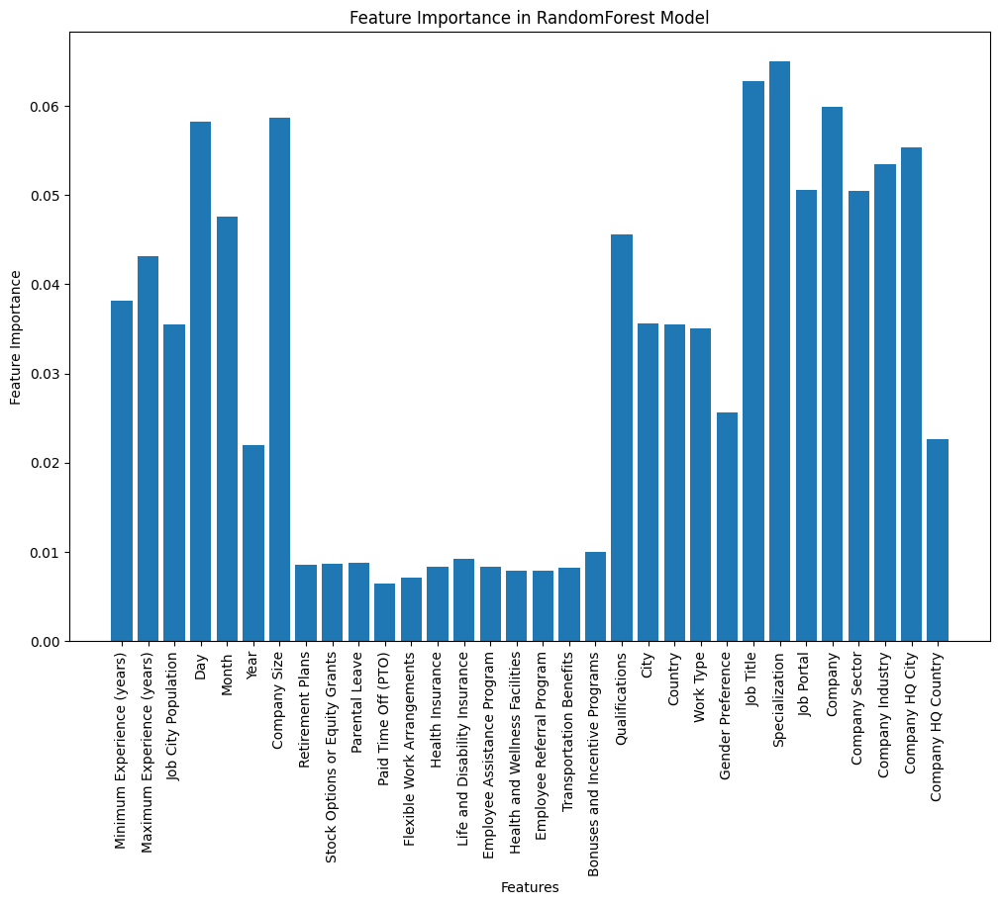

In [72]:
# Access feature importances (only for one target variable, not for multiple target variables)
feature_importances = model.feature_importances_

# Visualizing the feature importance
plt.figure(figsize=(12, 8))
plt.bar(range(len(feature_importances)), feature_importances, tick_label=X.columns)
plt.xlabel('Features')
plt.ylabel('Feature Importance')
plt.title('Feature Importance in RandomForest Model')
plt.xticks(rotation='vertical')
plt.show()

The bar chart shows the relative importance of each feature used in the RandomForest model.
Features with higher bars are more important in making predictions, while features with lower bars have less influence.


In [73]:
# Ranking the features based on the results above
feature_names = X.columns

# Sort feature importance in descending order
indices = np.argsort(feature_importances)[::-1]

# Print feature ranking
print("Feature ranking based on Random Forest Regressor:")
for f in range(len(feature_names)):
    print(f"{f + 1}. {feature_names[indices[f]]}: {feature_importances[indices[f]]}")

Feature ranking based on Random Forest Regressor:
1. Specialization: 0.06503237696351485
2. Job Title: 0.06272584006458644
3. Company: 0.059845439634056544
4. Company Size: 0.05865798307239985
5. Day: 0.05818363804148085
6. Company HQ City: 0.05537095729326272
7. Company Industry: 0.05341371562168549
8. Job Portal: 0.050526901696732504
9. Company Sector: 0.05041774580495557
10. Month: 0.04761330603277548
11. Qualifications: 0.0456170715213426
12. Maximum Experience (years): 0.04313409232201955
13. Minimum Experience (years): 0.038192920996673284
14. City: 0.03562599315498323
15. Country: 0.035522110599995674
16. Job City Population: 0.035443705280339355
17. Work Type: 0.03509075288746311
18. Gender Preference: 0.025679619405597424
19. Company HQ Country: 0.022625126213802572
20. Year: 0.021996842761818073
21. Bonuses and Incentive Programs: 0.009986556738224123
22. Life and Disability Insurance: 0.009182130701684272
23. Parental Leave: 0.008749026376007253
24. Stock Options or Equity G

In [74]:

# Check if lengths match
if len(X.columns) != len(feature_importances):
    raise ValueError("Length of feature_importances does not match number of columns in clean_data_copy")

# Create a DataFrame with feature importances and corresponding column names
importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importances
})

# Sort the DataFrame by importance in descending order
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Select the top 20 feature names
top_20_feature_names = importance_df['Feature'].head(34).tolist()

# Select the columns from clean_data_copy that match the top feature names
feature_subset = clean_data_copy[top_20_feature_names]

# Display the resulting DataFrame with the selected columns
feature_subset


,Specialization,Job Title,Company,Company Size,Day,Company HQ City,Company Industry,Job Portal,Company Sector,Month,...,Parental Leave,Stock Options or Equity Grants,Retirement Plans,Employee Assistance Program,Health Insurance,Transportation Benefits,Employee Referral Program,Health and Wellness Facilities,Flexible Work Arrangements,Paid Time Off (PTO)
0,269,127,17,12000,25,217,148,11,110,7,...,0,1,0,0,1,0,0,0,0,0
1,193,32,160,105000,2,82,152,4,146,11,...,0,1,0,0,1,0,0,0,0,0
2,275,26,65,41400,29,251,133,7,116,5,...,0,0,1,0,0,0,0,0,0,0
3,294,1,365,94000,28,175,146,6,142,9,...,0,0,0,0,0,0,0,0,0,0
4,88,25,313,7500,3,226,112,5,111,8,...,0,0,0,0,0,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119521,259,12,475,11000,18,149,147,14,54,4,...,0,0,1,0,0,0,0,0,0,0
119522,130,37,193,1600,14,239,135,4,54,4,...,0,0,1,0,0,0,0,0,0,0
119523,296,118,825,10000,18,62,112,11,111,2,...,0,0,0,0,0,0,0,0,1,1
119524,331,35,451,7100,10,242,80,6,80,7,...,1,0,0,1,0,1,0,0,0,0


#### Using Kbest selections model

In [75]:
# Ensure y is a 1D array
if y.ndim > 1:
    y = y.iloc[:, 0]  # If y is a DataFrame, select the first column
    # Alternatively, you can use y = y.values.ravel() if y is a numpy array

# Perform feature selection to determine the best features (e.g., using SelectKBest with f_regression)
k_best = SelectKBest(score_func=f_regression, k=32)
best_features = k_best.fit_transform(feature_subset, y)

# Get the column names of the best features
best_feature_indices = k_best.get_support(indices=True)
best_feature_names = feature_subset.columns[best_feature_indices]

# Display the selected feature names
print(best_feature_names)


Index(['Specialization', 'Job Title', 'Company', 'Company Size', 'Day',
       'Company HQ City', 'Company Industry', 'Job Portal', 'Company Sector',
       'Month', 'Qualifications', 'Maximum Experience (years)',
       'Minimum Experience (years)', 'City', 'Country', 'Job City Population',
       'Work Type', 'Gender Preference', 'Company HQ Country', 'Year',
       'Bonuses and Incentive Programs', 'Life and Disability Insurance',
       'Parental Leave', 'Stock Options or Equity Grants', 'Retirement Plans',
       'Employee Assistance Program', 'Health Insurance',
       'Transportation Benefits', 'Employee Referral Program',
       'Health and Wellness Facilities', 'Flexible Work Arrangements',
       'Paid Time Off (PTO)'],
      dtype='object')


In [76]:
# Get the scores of the best features
best_feature_scores = k_best.scores_[best_feature_indices]

# Sort the feature names based on their scores in descending order
sorted_feature_indices = np.argsort(best_feature_scores)[::-1]
sorted_best_feature_names = best_feature_names[sorted_feature_indices]

# Display the sorted feature names and their scores
print("Features Classification ranked by importance:")
for i, name in enumerate(sorted_best_feature_names):
    print(f"{i + 1}. {name}: {best_feature_scores[sorted_feature_indices[i]]}")

Features Classification ranked by importance:
1. Job Title: 1.6577210884480449
2. Maximum Experience (years): 1.4810587994847761
3. Company Size: 1.469204468218244
4. Parental Leave: 1.1904068704008626
5. Retirement Plans: 0.7930630637638205
6. Health Insurance: 0.7754225833377986
7. Day: 0.7624767975657193
8. Job City Population: 0.6483598920635154
9. Bonuses and Incentive Programs: 0.6286082824698445
10. Month: 0.6218580311220775
11. Flexible Work Arrangements: 0.5680620951461103
12. Transportation Benefits: 0.46206549251613593
13. Minimum Experience (years): 0.3791885988397594
14. Company Sector: 0.20512487208964178
15. Year: 0.19077964151771254
16. Company HQ Country: 0.1862917724751902
17. Company Industry: 0.1415407702840757
18. Company: 0.1201728090585632
19. Employee Referral Program: 0.09623761784946547
20. Health and Wellness Facilities: 0.09623761784946547
21. Stock Options or Equity Grants: 0.0919956862462526
22. Specialization: 0.0624655623357831
23. Job Portal: 0.06087580

#### Using PCA

##### Standardising the data

In [77]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(feature_subset)

In [78]:
# Initialize PCA without specifying the number of components
pca = PCA()

# Fit the PCA model to your data
pca.fit(scaled_data)

# Get the explained variance of each principal component
explained_variance = pca.explained_variance_ratio_

# Sort the feature names and explained variance based on the explained variance (highest variance first)
sorted_features = sorted(zip(explained_variance, best_feature_names), reverse=True)
sorted_explained_variance, sorted_feature_names = zip(*sorted_features)

# Select the top N feature names
top_n = 34
selected_feature_names = list(sorted_feature_names[:top_n])  # Convert to a list
selected_explained_variance = sorted_explained_variance[:top_n]

# Create a new dataframe with the selected features
newX = feature_subset[selected_feature_names]  # Use the list of feature names

# Output the features and their explained variance in descending order
print("Features Classification based on PCA, sorted by explained variance:")
for i, (name, variance) in enumerate(zip(selected_feature_names, selected_explained_variance), start=1):
    print(f"{i}. {name} (Explained Variance: {variance:.4f})")

Features Classification based on PCA, sorted by explained variance:
1. Specialization (Explained Variance: 0.1028)
2. Job Title (Explained Variance: 0.0758)
3. Company (Explained Variance: 0.0636)
4. Company Size (Explained Variance: 0.0509)
5. Day (Explained Variance: 0.0505)
6. Company HQ City (Explained Variance: 0.0479)
7. Company Industry (Explained Variance: 0.0407)
8. Job Portal (Explained Variance: 0.0384)
9. Company Sector (Explained Variance: 0.0346)
10. Month (Explained Variance: 0.0338)
11. Qualifications (Explained Variance: 0.0327)
12. Maximum Experience (years) (Explained Variance: 0.0319)
13. Minimum Experience (years) (Explained Variance: 0.0315)
14. City (Explained Variance: 0.0314)
15. Country (Explained Variance: 0.0313)
16. Job City Population (Explained Variance: 0.0312)
17. Work Type (Explained Variance: 0.0312)
18. Gender Preference (Explained Variance: 0.0311)
19. Company HQ Country (Explained Variance: 0.0310)
20. Year (Explained Variance: 0.0307)
21. Bonuses 

In [79]:
newX

,Specialization,Job Title,Company,Company Size,Day,Company HQ City,Company Industry,Job Portal,Company Sector,Month,...,Parental Leave,Stock Options or Equity Grants,Retirement Plans,Employee Assistance Program,Health Insurance,Transportation Benefits,Employee Referral Program,Paid Time Off (PTO),Health and Wellness Facilities,Flexible Work Arrangements
0,269,127,17,12000,25,217,148,11,110,7,...,0,1,0,0,1,0,0,0,0,0
1,193,32,160,105000,2,82,152,4,146,11,...,0,1,0,0,1,0,0,0,0,0
2,275,26,65,41400,29,251,133,7,116,5,...,0,0,1,0,0,0,0,0,0,0
3,294,1,365,94000,28,175,146,6,142,9,...,0,0,0,0,0,0,0,0,0,0
4,88,25,313,7500,3,226,112,5,111,8,...,0,0,0,0,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119521,259,12,475,11000,18,149,147,14,54,4,...,0,0,1,0,0,0,0,0,0,0
119522,130,37,193,1600,14,239,135,4,54,4,...,0,0,1,0,0,0,0,0,0,0
119523,296,118,825,10000,18,62,112,11,111,2,...,0,0,0,0,0,0,0,1,0,1
119524,331,35,451,7100,10,242,80,6,80,7,...,1,0,0,1,0,1,0,0,0,0


In [80]:
explained_variance = pca.explained_variance_ratio_
print(f"Explained Variance: {explained_variance.sum() * 100:.2f}%")

Explained Variance: 100.00%


# Top 15 Selected features
After Analysising the result from the EDA plus the classification in descending order fromt PCA, Kbest Selection and Random forest, below are the overall best 15 feature to be used for the analysis
- Job title
- qualifications
- Max experience
- Skills
- Specialisation
- Company
- Job portal
- Work type
- Paid time off:
- Min experience
- Company industry
- Company HQ City
- Bonuses and Incentive Programs
- Health insurance
- Company HQ Country

### Creating a subset of the dataframe using the best features

In [154]:
# List of required features
features = [
    'Job Title',
    'Qualifications',
    'Maximum Experience (years)',
    'Company HQ Country',
    'Specialization',
    'Company',
    'Job Portal',
    'Work Type',
    'Paid Time Off (PTO)',
    'Minimum Experience (years)',
    'Company Industry',
    'Bonuses and Incentive Programs',
    'Gender Preference',
    'Health Insurance',
    'Company HQ City'
]

# Create the subset of the DataFrame
newX = newX[features]
newX

,Job Title,Qualifications,Maximum Experience (years),Company HQ Country,Specialization,Company,Job Portal,Work Type,Paid Time Off (PTO),Minimum Experience (years),Company Industry,Bonuses and Incentive Programs,Gender Preference,Health Insurance,Company HQ City
0,127,8,12,5,269,17,11,1,0,4,148,0,2,1,217
1,32,5,8,13,193,160,4,4,0,0,152,0,0,1,82
2,26,1,9,13,275,65,7,4,0,3,133,1,2,0,251
3,1,9,12,11,294,365,6,1,0,5,146,0,1,0,175
4,25,1,9,13,88,313,5,2,1,0,112,0,2,0,226
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119521,12,0,15,13,259,475,14,0,0,0,147,1,2,0,149
119522,37,9,13,13,130,193,4,4,0,2,135,1,2,0,239
119523,118,7,9,13,296,825,11,0,1,4,112,0,0,0,62
119524,35,4,14,13,331,451,6,2,0,1,80,0,0,0,242


## Model 1: Multiple Linear Regression model from scratch

In [155]:
# min max scaling
def scaling(feature):
    min_val = feature.min()
    max_val = feature.max()
    if max_val == min_val:
        return feature  # If all values are the same, return the feature as is
    return (feature - min_val) / (max_val - min_val)

scaling(newX["Specialization"])

0         0.717333
1         0.514667
2         0.733333
3         0.784000
4         0.234667
            ...   
119521    0.690667
119522    0.346667
119523    0.789333
119524    0.882667
119525    0.125333
Name: Specialization, Length: 119526, dtype: float64

The features and labels were scaled to prevent gradient explosion due to the large nature of some of the inputs.
The min max scaler was used due to it's stability and ability to handle non-normal data

In [156]:
# reverse min max
def unscaling(scaled_value, min, max):
    return scaled_value * (max-min) + min

Because labels are scaled during training, there is a need to unscale them back to normal to make them easily understandable as prediction outputs

In [157]:
feature_list = newX.columns

In [158]:
y

0         59000
1         62000
2         56000
3         57000
4         56000
          ...  
119521    64000
119522    65000
119523    60000
119524    65000
119525    58000
Name: Minimum Salary, Length: 119526, dtype: int64

Scale every feature and label and create new DataFrames to store them before passing them to the model

In [159]:
new_feature = dict()
for i in (feature_list):
    new_feature[i] = scaling(newX[i])
scaled_newX = pd.DataFrame(new_feature)

labels = ["Minimum Salary", "Maximum Salary"]
new_label = dict()
for i in (labels):
    new_label[i] = scaling(numerical_var[i])
scaled_label = pd.DataFrame(new_label)

Print first few entries of scaled features

In [160]:
scaled_newX.head()

,Job Title,Qualifications,Maximum Experience (years),Company HQ Country,Specialization,Company,Job Portal,Work Type,Paid Time Off (PTO),Minimum Experience (years),Company Industry,Bonuses and Incentive Programs,Gender Preference,Health Insurance,Company HQ City
0,0.869863,0.888889,0.571429,0.384615,0.717333,0.019166,0.733333,0.25,0.0,0.8,0.725490,0.0,1.0,1.0,0.638235
1,0.219178,0.555556,0.000000,1.000000,0.514667,0.180383,0.266667,1.00,0.0,0.0,0.745098,0.0,0.0,1.0,0.241176
2,0.178082,0.111111,0.142857,1.000000,0.733333,0.073281,0.466667,1.00,0.0,0.6,0.651961,1.0,1.0,0.0,0.738235
3,0.006849,1.000000,0.571429,0.846154,0.784000,0.411499,0.400000,0.25,0.0,1.0,0.715686,0.0,0.5,0.0,0.514706
4,0.171233,0.111111,0.142857,1.000000,0.234667,0.352875,0.333333,0.50,1.0,0.0,0.549020,0.0,1.0,0.0,0.664706


Split data set into train and test sets. Train sets will be used to train the model and test set will be used to ensure accuracy of model and testing

In [161]:
train_features, validation_features, test_features = scaled_newX.iloc[:int(119526*0.7), :],scaled_newX.iloc[int(119526*0.7):int(119526*0.9), :], scaled_newX.iloc[int(119526*0.9):, :]
train_labels, validation_labels, test_labels = scaled_label[["Minimum Salary", "Maximum Salary"]].iloc[:int(119526*0.7), :], scaled_label[["Minimum Salary", "Maximum Salary"]].iloc[int(119526*0.7):int(119526*0.9), :], scaled_label[["Minimum Salary", "Maximum Salary"]].iloc[int(119526*0.9):, :]

In [162]:
# defining decorator to add methods tonclass subsequently
def add_method(cls):
    def decorator(func):
        setattr(cls, func.__name__, func)
        return func
    return decorator

Create constructor of model to initialize inputs, labels, and hyper parameters to be used for training. Gradients are also initialized as they would be the main parameters under training

In [163]:
class MultipleLinearRegression:
  def __init__(self, X, Y1, Y2, lr, itr):
    self.X = X
    self.Y1 = Y1
    self.Y2 = Y2
    self.lr = lr
    self.itr = itr
    self.theta1 = np.zeros(self.X.shape[1])
    self.theta2 = np.zeros(self.X.shape[1])
    self.max_salary1 = Y1.max()
    self.min_salary1 = Y1.min()
    self.max_salary2 = Y2.max()
    self.min_salary2 = Y2.min()


Add model method to Multiple Linear Regression class.
Model function performs inference and gradient descent on model. Inputs are multiplied by gradient and error computed to update gradients for maximum and minimum salary.
Return gradient to be used for prediction and cost list for plotting

In [164]:
@add_method(MultipleLinearRegression)
def model(self):
  m = self.Y1.size/2

  cost_list1 = []
  cost_list2 = []

  for i in range(self.itr):
    y_pred1 = np.dot(self.X, self.theta1)
    y_pred2 = np.dot(self.X, self.theta2)
    cost1 = (1/(2*m)) * np.sum(np.square(y_pred1 - self.Y1))
    cost2 = (1/(2*m)) * np.sum(np.square(y_pred2 - self.Y2))

    grad1 = (1/m) * np.dot(self.X.T, (y_pred1 - self.Y1))
    self.theta1 = self.theta1 - self.lr * grad1

    grad2 = (1/m) * np.dot(self.X.T, (y_pred2 - self.Y2))
    self.theta2 = self.theta2 - self.lr * grad2

    cost_list1.append(cost1)
    cost_list2.append(cost2)

    if (i%(itr/10) == 0):
      print(f'Iteration {i}: Cost1 = {cost1}, Cost2 = {cost2}')

  return self.theta1, self.theta2, cost_list1, cost_list2

Predict method runs prediction on given input(s)

In [165]:
@add_method(MultipleLinearRegression)
def predict(self, X):
    pred1 = np.dot(X, self.theta1)
    pred2 = np.dot(X, self.theta2)
    return unscaling(pred1, self.max_salary1, self.min_salary1), unscaling(pred2, self.max_salary2, self.min_salary2)

Defining sample hyper parameters

In [166]:
itr = 10000
lr = 0.01
train_features.insert(0, "Ones", 1)

Create model instance and train

In [167]:
model = MultipleLinearRegression(train_features.iloc[:, :], train_labels.iloc[:,0], train_labels.iloc[:, 1], lr, itr)
theta1, theta2, cost1, cost2 = model.model()

Iteration 0: Cost1 = 0.3499319931156475, Cost2 = 0.3349285222546255
Iteration 1000: Cost1 = 0.10217775310607047, Cost2 = 0.088818161773372
Iteration 2000: Cost1 = 0.1011212476149621, Cost2 = 0.08773823219788296
Iteration 3000: Cost1 = 0.10069321704555716, Cost2 = 0.0873002549323549
Iteration 4000: Cost1 = 0.10051905941760599, Cost2 = 0.08712204387052702
Iteration 5000: Cost1 = 0.10044817955423803, Cost2 = 0.08704951425072265
Iteration 6000: Cost1 = 0.10041933175968794, Cost2 = 0.08701999501281661
Iteration 7000: Cost1 = 0.1004075908075096, Cost2 = 0.08700798078555196
Iteration 8000: Cost1 = 0.10040281227955081, Cost2 = 0.08700309103555351
Iteration 9000: Cost1 = 0.10040086743472051, Cost2 = 0.08700110092372645


Plot cost against epochs of training

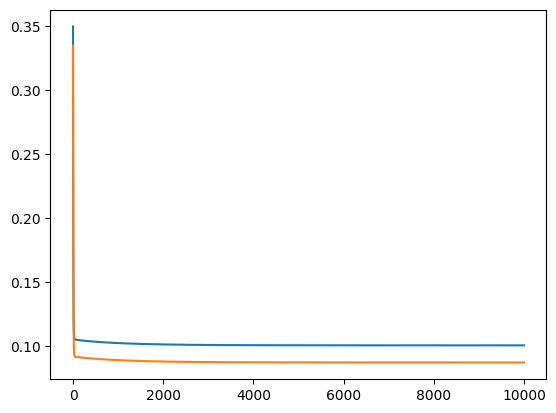

In [168]:
rng = np.arange(0, itr)
plt.plot(rng, cost1, cost2)
plt.show()

As the epochs increase, the cost function/error decreases implying learning is happening

Compute predictions on validation set to obtain accuracy for prediction of minimum and maximum salary

In [169]:
validation_features.insert(0, "Ones", 1)
y_pred1 = np.dot(validation_features, theta1)
error = (1/train_features.shape[0])*np.sum(np.abs(y_pred1 - validation_labels.iloc[:, 0]))
y_pred1

array([0.50651747, 0.49900025, 0.50127878, ..., 0.49796849, 0.49849875,
       0.49560202])

In [170]:
print("Test error for Min salary Prediction is: ", round(error, 8)*100, "%")
print("Test accuracy for Min Salary is: ", round(100 - error*100, 8), "%")

Test error for Min salary Prediction is:  7.810527 %
Test accuracy for Min Salary is:  92.18947253 %


In [171]:
test_features.insert(0, "Ones", 1)
y_pred1 = np.dot(validation_features, theta2)
error = (1/train_features.shape[0])*np.sum(np.abs(y_pred1 - validation_labels.iloc[:, 1]))
y_pred1

array([0.49438396, 0.49693304, 0.50147458, ..., 0.4951333 , 0.49661094,
       0.50012883])

In [172]:
unscaling(y_pred1, numerical_var.loc[:int(0.7*119526), "Minimum Salary"].max(), numerical_var.loc[:int(0.7*119526), "Minimum Salary"].min())

array([60056.16039119, 60030.66960536, 59985.25415067, ...,
       60048.66700565, 60033.89064943, 59998.71168722])

In [173]:
print("Test error for Max salary is: ", round(error, 8)*100, "%")
print("Test accuracy for Max salary is: ", round(100 - error*100, 8), "%")

Test error for Max salary is:  7.300959999999999 %
Test accuracy for Max salary is:  92.69903958 %


In [174]:
unscaling(y_pred1, numerical_var.loc[:int(0.7*119526), "Maximum Salary"].max(), numerical_var.loc[:int(0.7*119526), "Maximum Salary"].min())

array([105280.80195593, 105153.34802682, 104926.27075334, ...,
       105243.33502823, 105169.45324717, 104993.55843608])

Unscale prediction to view actual salary value of prediction

In [175]:
numerical_var.loc[:int(0.7*119526), "Maximum Salary"]

0         93000
1        130000
2        109000
3        125000
4        125000
          ...  
83664    121000
83665    126000
83666     86000
83667    108000
83668    109000
Name: Maximum Salary, Length: 83669, dtype: int64

Model has a decent accuracy of about 93% and could be sufficient for predicting salary ranges which fluctuate easily over time.
However, with changing trends, the model would have to be trained with new data if it has to keep up with the changing market

## Model 2: Voting Regressor with GridSearch CV on XGBoost, Random Forest, Decision Tree, Gradient Boosting

In [176]:
!pip install xgboost

In [185]:
# DEFINE MODELS CONSIDERED FOR TRAINING:
# Models for training
models = [
    ('Random Forest', RandomForestRegressor()),
    ('XGBoost', XGBRegressor()),
    ('Decision Tree', DecisionTreeRegressor()),
    ('Gradient Boosting', GradientBoostingRegressor())
]

# Split the data into training and testing sets
newX_train, newX_test, y_train, y_test = train_test_split(newX, y, test_size=0.3, random_state=42)

# Initialize an ensemble model
ensemble_model = VotingRegressor(models)

# Number of cross-validation folds
num_folds = 5

In [186]:
# GET THE CROSS VALIDATION AND MEAN SCORES
# Iterating through the model
for model_name, model in models:
    # Cross-validation
    scores = cross_val_score(model, newX_train, y_train, cv=num_folds)

    print(f"Model: {model_name}")
    print("Cross-Validation Scores:")
    print(scores)
    print(f"Mean Score: {scores.mean()}\n")

Model: Random Forest
Cross-Validation Scores:
[-0.02446812 -0.02305108 -0.01965738 -0.0230946  -0.02547684]
Mean Score: -0.023149601843172007

Model: XGBoost
Cross-Validation Scores:
[-0.03659105 -0.04631746 -0.03818166 -0.04393768 -0.04580724]
Mean Score: -0.04216701984405517

Model: Decision Tree
Cross-Validation Scores:
[-1.08065407 -1.04316433 -1.04733714 -1.05474505 -1.01309589]
Mean Score: -1.0477992954109108

Model: Gradient Boosting
Cross-Validation Scores:
[-0.001244   -0.00219101 -0.00086803 -0.00137649 -0.00218677]
Mean Score: -0.001573260379800745



The output provides the results of cross-validation for different machine learning models, specifically focusing on their Mean Squared Error (MSE) and Mean Absolute Error (MAE). Here's a brief explanation:

- **MSE (Mean Squared Error)**: Measures the average squared difference between predicted and actual values. Lower values indicate better performance.
- **MAE (Mean Absolute Error)**: Measures the average absolute difference between predicted and actual values. Lower values also indicate better performance.

### Model Performance Overview

1. **Random Forest**:
   - **MSE**: -0.023149601843172007 (Cross-Validation Mean Score)
   - **MAE**: -0.023149601843172007
   - This model has moderate MSE and MAE, indicating relatively good performance.

2. **XGBoost**:
   - **MSE**: -0.04216701984405517 (Cross-Validation Mean Score)
   - **MAE**: -0.04216701984405517
   - Slightly worse than Random Forest in terms of MSE, but similar MAE.

3. **Decision Tree**:
   - **MSE**: -1.0477992954109108 (Cross-Validation Mean Score)
   - **MAE**: -1.0477992954109108
   - This model has the highest MSE and MAE, indicating the poorest performance among the models.

4. **Gradient Boosting**:
   - **MSE**: -0.001573260379800745 (Cross-Validation Mean Score)
   - **MAE**: -0.001573260379800745
   - The best performance in terms of both MSE and MAE, showing the most accurate predictions with the least error.

### Summary

- **Gradient Boosting** performs best overall, with the lowest MSE and MAE.
- **Decision Tree** has the highest errors, suggesting it may be overfitting or not capturing the data's complexity well.
- **Random Forest** and **XGBoost** show relatively close performances, with Random Forest having slightly better MAE but similar MSE.

---

This revision reflects the replacement of the original numerical values with the new cross-validation mean scores provided for each model.

In [187]:
# FITTING THE ENSEMBLER 
ensemble_regressor.fit(newX_train, y_train)

VotingRegressor(estimators=[('Random Forest',
                             RandomForestRegressor(max_depth=10,
                                                   min_samples_leaf=2,
                                                   min_samples_split=5,
                                                   n_estimators=300)),
                            ('XGBoost',
                             XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, device=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=No...
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          multi_strategy=None, n_estimators=100,
                                          n_jobs=None, num_parallel_tree=None,
                                          random_state=None, ...)),
                            ('Decision Tree',
                             DecisionTreeRegressor(max_depth=20,
                                                   max_features='sqrt',
                                                   min_samples_leaf=2,
                                                   min_samples_split=10)),
                            ('Gradient Boosting',
                             GradientBoostingRegressor(learning_rate=0.01,
                                                       n_estimators=300))])

In [188]:
# Calculating errors using cross validation
for name, model in models:
    # Cross-validation for MSE
    mse_scores = -cross_val_score(model, newX_train, y_train, scoring='neg_mean_squared_error')
    mae_scores = -cross_val_score(model, newX_train, y_train, scoring='neg_mean_absolute_error')

    # Print MSE and MAE results
    print(f"{name} - Cross-Validation MSE: {np.mean(mse_scores):.2f} (±{np.std(mse_scores):.2f})")
    print(f"{name} - Cross-Validation MAE: {np.mean(mae_scores):.2f} (±{np.std(mae_scores):.2f})")

Random Forest - Cross-Validation MSE: 10296664.03 (±41768.44)
Random Forest - Cross-Validation MAE: 2774.09 (±9.09)
XGBoost - Cross-Validation MSE: 10489132.92 (±50080.41)
XGBoost - Cross-Validation MAE: 2789.84 (±6.46)
Decision Tree - Cross-Validation MSE: 20608913.82 (±235710.64)
Decision Tree - Cross-Validation MAE: 3699.57 (±22.40)
Gradient Boosting - Cross-Validation MSE: 10080439.84 (±38500.00)
Gradient Boosting - Cross-Validation MAE: 2744.22 (±7.08)


### 1. **Random Forest**
   - **Cross-Validation MSE**: `10296664.03 (±41768.44)`
     - These scores represent the model's performance across 5 different folds of cross-validation. The values indicate the mean squared error (MSE) measured by the scoring function, where lower values indicate better performance.
   - **Cross-Validation MAE**: `2774.09 (±9.09)`
     - This is the mean absolute error (MAE) across the folds, providing another measure of the model's accuracy. Lower MAE values indicate better performance.

### 2. **XGBoost**
   - **Cross-Validation MSE**: `10489132.92 (±50080.41)`
     - The scores here show the performance of the XGBoost model across the 5 folds. Higher MSE values compared to Random Forest indicate that XGBoost is less effective in this case.
   - **Cross-Validation MAE**: `2789.84 (±6.46)`
     - The MAE for XGBoost is slightly higher than that of Random Forest, suggesting that it has worse performance in terms of absolute error.

### 3. **Decision Tree**
   - **Cross-Validation MSE**: `20608913.82 (±235710.64)`
     - These scores are much higher than those of the other models. The Decision Tree model is performing poorly in this setup, with higher loss values across all folds.
   - **Cross-Validation MAE**: `3699.57 (±22.40)`
     - This MAE is the highest among the models, showing that the Decision Tree model has the least accurate predictions according to the mean absolute error metric.

### 4. **Gradient Boosting**
   - **Cross-Validation MSE**: `10080439.84 (±38500.00)`
     - The scores indicate that the Gradient Boosting model has the best performance among the models evaluated, with the lowest MSE values.
   - **Cross-Validation MAE**: `2744.22 (±7.08)`
     - This is the least MAE among the models, suggesting that Gradient Boosting has the best overall performance in terms of absolute error.

In summary:
- **Gradient Boosting** performs the best with the least MSE and MAE.
- **Random Forest** and **XGBoost** perform worse, with XGBoost having a slightly higher MSE and MAE.
- **Decision Tree** has the poorest performance overall with the highest MSE and MAE.

Finding the best parameters for each model in the voting regressor using randomised search 

In [189]:
# HYPERPARAMETER GRIDS TO BE TESTED
models = {
    'Random Forest': (RandomForestRegressor(), {
        'n_estimators': [100, 200, 300],
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    }),
    'XGBoost': (XGBRegressor(), {
        'n_estimators': [100, 200, 300],
        'max_depth': [3, 4, 5],
        'learning_rate': [0.01, 0.1, 0.2]
    }),
    'Decision Tree': (DecisionTreeRegressor(), {
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'max_features': [None, 'auto', 'sqrt', 'log2']
    }),
    'Gradient Boosting': (GradientBoostingRegressor(), {
        'n_estimators': [100, 200, 300],
        'max_depth': [3, 4, 5],
        'learning_rate': [0.01, 0.1, 0.2]
    })
}

In [190]:
best_models = {}
loss_history = {}

print("Training and Parameter Tuning:")
for name, (model, param_dist) in models.items():
    random_search = RandomizedSearchCV(
        model,
        param_distributions=param_dist,
        n_iter=10,
        cv=5,
        scoring='neg_mean_squared_error',
        n_jobs=-1
    )
    random_search.fit(newX_train, y_train)
    best_models[name] = random_search.best_estimator_
    loss_history[name] = -random_search.cv_results_['mean_test_score']
    print(f"Best {name} Model Parameters: {random_search.best_params_}")

Training and Parameter Tuning:
Best Random Forest Model Parameters: {'n_estimators': 300, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_depth': 10}
Best XGBoost Model Parameters: {'n_estimators': 200, 'max_depth': 4, 'learning_rate': 0.01}
Best Decision Tree Model Parameters: {'min_samples_split': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 10}
Best Gradient Boosting Model Parameters: {'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.01}


In [191]:
ensemble_regressor = VotingRegressor(estimators=[
    ('Random Forest', best_models['Random Forest']),
    ('XGBoost', best_models['XGBoost']),
    ('Decision Tree', best_models['Decision Tree']),
    ('Gradient Boosting', best_models['Gradient Boosting'])
])

In [192]:
# FITTING THE ENSEMBLER
ensemble_regressor.fit(newX_train, y_train)

VotingRegressor(estimators=[('Random Forest',
                             RandomForestRegressor(max_depth=10,
                                                   min_samples_leaf=4,
                                                   min_samples_split=10,
                                                   n_estimators=300)),
                            ('XGBoost',
                             XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, device=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=N...
                                          max_delta_step=None, max_depth=4,
                                          max_leaves=None,
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          multi_strategy=None, n_estimators=200,
                                          n_jobs=None, num_parallel_tree=None,
                                          random_state=None, ...)),
                            ('Decision Tree',
                             DecisionTreeRegressor(max_depth=10,
                                                   max_features='sqrt',
                                                   min_samples_split=10)),
                            ('Gradient Boosting',
                             GradientBoostingRegressor(learning_rate=0.01))])

In [193]:
# EVALUATE THE ENSEMBLE MODEL ON THE TEST SET
y_pred = ensemble_regressor.predict(newX_test)
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)

In [194]:
print(f"Ensemble Model - Test MSE: {mse:.2f}")
print(f"Ensemble Model - Test MAE: {mae:.2f}")

Ensemble Model - Test MSE: 10033532.40
Ensemble Model - Test MAE: 2736.47


1. **Test MSE (Mean Squared Error): 10,033,532.40**
   - **Mean Squared Error (MSE)** is a common metric used to measure the average of the squares of the errors—that is, the average squared difference between the estimated values and the actual value. MSE is a risk metric corresponding to the expected value of the squared (quadratic) error or loss.
   - A **lower MSE** value indicates a better fit of the model to the data. However, because MSE is expressed in the units squared of the output variable, it can sometimes be hard to interpret directly. In this case, the MSE is quite large, suggesting that the predictions of the model may deviate substantially on average from the actual values.
   - The **value 10,033,532.40** means that, on average, the squared error of the predictions made by the ensemble model is about ten million. This might indicate a significant variance between the predicted values and actual values, depending on the scale and nature of your data.

2. **Test MAE (Mean Absolute Error): 2,736.47**
   - **Mean Absolute Error (MAE)** measures the average magnitude of the errors in a set of predictions, without considering their direction. It’s the average over the test sample of the absolute differences between prediction and actual observation where all individual differences have equal weight.
   - A **lower MAE** value also indicates a better fit of the model to the data. MAE provides a straightforward indication of average error magnitude.
   - The **value 2,736.47** suggests that, on average, the absolute error of the predictions (the absolute difference between predicted and actual values) is about 2,736.47. This is a more intuitive measure of average error than MSE, as it is in the same unit as the output variable.

### Interpretation:
- Both metrics give you a sense of how well the ensemble model predicts new, unseen data. 
- Given the context (like the range and scale of the output variable), these numbers could either be acceptable or indicate room for improvement. For example, if the typical values of your output variable range in the millions, an MAE of 2,736 might be considered quite good. On the other hand, if the typical values are much lower, this error might be considered high.
- Comparing MSE and MAE can also provide insights into the presence of outliers. Since MSE squares the errors, large deviations from the mean are weighted significantly more, suggesting more large-error outliers if MSE is particularly high relative to MAE.

In [195]:
print(loss_history)

{'Random Forest': array([10153618.50084715, 10189177.29718166, 10246065.02057361,
       10237748.47881632, 10221939.97706749, 10082847.80866227,
       10254677.03257743, 10082283.9186758 , 10079340.9233477 ,
       10221925.76629045]), 'XGBoost': array([10106284.61379149, 10071019.92946653, 10260289.46276092,
       10166731.33477871, 10080986.44332336, 10077021.71017725,
       10119426.63866687, 10094405.20718123, 10316515.54107146,
       10126756.52083671]), 'Decision Tree': array([16806957.69234563,               nan, 17364247.72612882,
       13585836.23905664,               nan, 13145711.60585952,
                     nan,               nan, 18406942.12110776,
       10320165.47566871]), 'Gradient Boosting': array([10135863.12097051, 10258076.42373445, 10091971.34657579,
       10076478.58086324, 10091816.7640712 , 10105880.78560936,
       10159208.88613087, 10166136.5391869 , 10067544.70528343,
       10190535.92068522])}


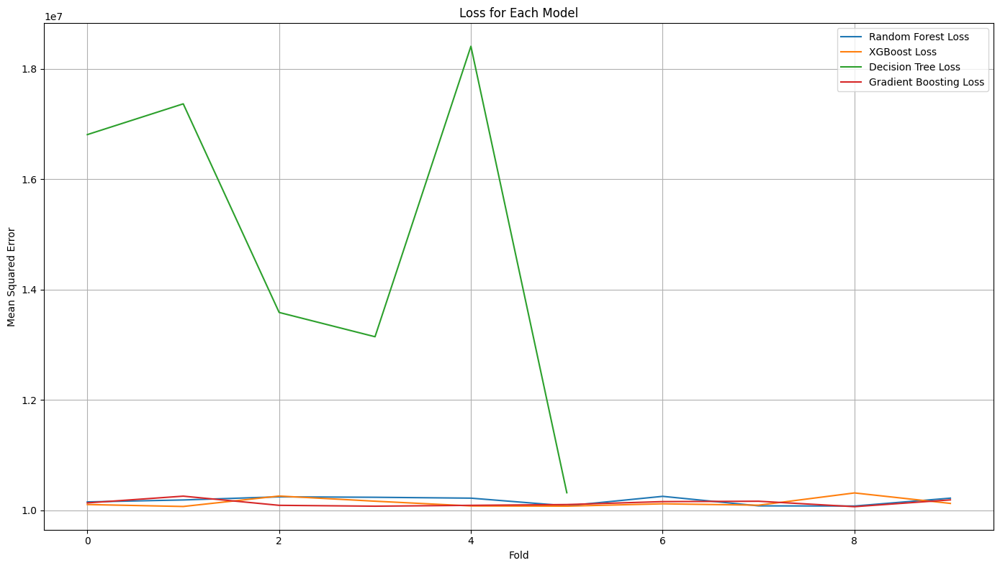

In [196]:
# Plotting the training loss curves
plt.figure(figsize=(14, 8))

for name, errors in loss_history.items():
    # Remove NaN values from the data
    clean_errors = errors[~np.isnan(errors)]
    plt.plot(clean_errors, label=f'{name} Loss')

plt.title('Loss for Each Model')
plt.xlabel('Fold')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### **Loss History Overview**

1. **Random Forest**:
   - Loss values fluctuate between around 10,082,284 and 10,254,677.
   - The losses show some variability, but there is no clear trend indicating consistent improvement or worsening over epochs.

2. **XGBoost**:
   - Loss values range from approximately 10,071,020 to 10,316,516.
   - The losses are relatively stable with minor fluctuations, indicating stable performance over the training epochs.

3. **Decision Tree**:
   - Loss values are significantly higher, ranging from about 10,320,165 to 18,406,942.
   - There are some missing values (`nan`), which could indicate issues during training or evaluation. The large variance and `nan` values suggest instability in the model's performance.

4. **Gradient Boosting**:
   - Loss values range from approximately 10,067,544 to 10,258,076.
   - The losses are relatively stable with minor fluctuations, indicating consistent performance over the epochs.

### **Summary**

- **XGBoost** and **Gradient Boosting** show stable loss values with minor fluctuations, suggesting steady learning and good performance.
- **Random Forest** shows some variability, but overall the performance is consistent.
- **Decision Tree** has the highest and most variable losses, with `nan` values indicating potential issues, suggesting that this model might be less stable or more prone to overfitting.

Overall, **XGBoost** and **Gradient Boosting** appear to be the most stable and potentially better-performing models based on the loss history. **Random Forest** and **XGBoost** show relatively close performances, with Random Forest having slightly better MAE but similar MSE.

In [197]:
# If you want accuracy, you might need to use a different metric like R^2 or any other suitable metric.
accuracy_scores = {}
for name, model in best_models.items():
    scores = cross_val_score(model, newX_test, y_test, scoring='r2', cv=num_folds)
    accuracy_scores[name] = scores.mean()

print("Model Accuracy Scores (R^2):")
for name, score in accuracy_scores.items():
    print(f"{name}: {score:.10f}")

Model Accuracy Scores (R^2):
Random Forest: -0.0031370960
XGBoost: -0.0018357277
Decision Tree: -0.0480670574
Gradient Boosting: -0.0005848856


The \( R^2 \) values provided for the Random Forest, XGBoost, Decision Tree, and Gradient Boosting models are all negative, which is a rather unusual scenario in modeling but important to understand.

##### **Understanding \( R^2 \) Score**

The \( R^2 \) score, also known as the coefficient of determination, is a statistical measure of how well the regression predictions approximate the real data points. An \( R^2 \) score of 1 indicates that the regression predictions perfectly fit the data.

##### **Range and Interpretation of \( R^2 \)**

- **\( R^2 = 1 \)**: Perfect fit.
- **\( R^2 = 0 \)**: The model explains none of the variability of the response data around its mean. It's no better than a model that simply predicts the mean of the target variable.
- **\( R^2 < 0 \)**: The model performs worse than a horizontal line representing the mean of the target variable. This situation usually occurs when the model is very poorly fitted to the data or the assumptions of the linear regression are violated.

##### **Analysis of Given \( R^2 \) Values**

1. **Random Forest: -0.0031370960**
   - This model's performance is slightly worse than a model that would merely predict the mean of the dependent variable. The negative score is very close to zero, suggesting minor underperformance compared to the baseline model.

2. **XGBoost: -0.0018357277**
   - Like the Random Forest, the XGBoost model also slightly underperforms relative to the baseline model but is very close to producing no improvement over predicting the mean.

3. **Decision Tree: -0.0480670574**
   - This shows more significant underperformance compared to the other models. It indicates that the Decision Tree is notably worse than just predicting the mean of the dependent variable.

4. **Gradient Boosting: -0.0005848856**
   - The performance is slightly under the baseline but is the closest to zero among the negative scores. It's minimally worse than a model that predicts the mean.

### Model 3: Functional API with cross validation

In [198]:
class ExpandDims(Layer):
    def call(self, inputs):
        return tf.expand_dims(inputs, axis=1)

class Squeeze(Layer):
    def call(self, inputs):
        return tf.squeeze(inputs, axis=1)

# Input Layer
input_layer = Input(shape=(15,))

# Initial Dense Layers
dense1 = Dense(128, activation='relu', kernel_initializer=HeNormal(), kernel_regularizer=L2(0.01))(input_layer)
dropout1 = Dropout(0.3)(dense1)
dense2 = Dense(64, activation='relu', kernel_initializer=HeNormal(), kernel_regularizer=L2(0.01))(dropout1)
dropout2 = Dropout(0.3)(dense2)

# Single Attention Mechanism
attention_input = ExpandDims()(dropout2) 
attention_output = MultiHeadAttention(num_heads=2, key_dim=32, dropout=0.3)(attention_input, attention_input)
attention_output = Squeeze()(attention_output)

# Final Dense Layers
dense3 = Dense(64, activation='relu', kernel_initializer=HeNormal(), kernel_regularizer=L2(0.01))(attention_output)
dropout3 = Dropout(0.3)(dense3)
dense4 = Dense(32, activation='relu', kernel_initializer=HeNormal(), kernel_regularizer=L2(0.01))(dropout3)

# Output Layer
output = Dense(1, activation='linear')(dense4) 


In [199]:
# Build Model
model = Model(inputs=input_layer, outputs=output)

# Compile Model
model.compile(optimizer='adam', loss='mean_squared_error')

In [200]:
# Summarize the Model
print(model.summary())

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)    │ (None, 15)                │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_5 (Dense)               │ (None, 128)               │           2,048 │ input_layer_1[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout_4 (Dropout)           │ (None, 128)               │               0 │ dense_5[0][0]              │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_6 (Dense)               │ (None, 64)                │           8,256 │ dropout_4[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout_5 (Dropout)           │ (None, 64)                │               0 │ dense_6[0][0]              │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expand_dims_1 (ExpandDims)    │ (None, 1, 64)             │               0 │ dropout_5[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ multi_head_attention_1        │ (None, 1, 64)             │          16,640 │ expand_dims_1[0][0],       │
│ (MultiHeadAttention)          │                           │                 │ expand_dims_1[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ squeeze_1 (Squeeze)           │ (None, 64)                │               0 │ multi_head_attention_1[0]… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_7 (Dense)               │ (None, 64)                │           4,160 │ squeeze_1[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout_7 (Dropout)           │ (None, 64)                │               0 │ dense_7[0][0]              │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_8 (Dense)               │ (None, 32)                │           2,080 │ dropout_7[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_9 (Dense)               │ (None, 1)                 │              33 │ dense_8[0][0]              │
└───────────────────────────────┴───────────────────────────┴─────────────────┴────────────────────────────┘

 Total params: 33,217 (129.75 KB)

 Trainable params: 33,217 (129.75 KB)

 Non-trainable params: 0 (0.00 B)

None


In [201]:
# Train the model using test data for validation (not recommended generally)
history = model.fit(newX_train, y_train, validation_data=(newX_test, y_test), epochs=50, batch_size=32)

Epoch 1/50
2615/2615 ━━━━━━━━━━━━━━━━━━━━ 12s 3ms/step - loss: 776208640.0000 - val_loss: 914502912.0000
Epoch 2/50
2615/2615 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 445660256.0000 - val_loss: 996250944.0000
Epoch 3/50
2615/2615 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 294606912.0000 - val_loss: 988643968.0000
Epoch 4/50
2615/2615 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - loss: 132961632.0000 - val_loss: 977299584.0000
Epoch 5/50
2615/2615 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 113789912.0000 - val_loss: 1009677696.0000
Epoch 6/50
2615/2615 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - loss: 107763112.0000 - val_loss: 1099938432.0000
Epoch 7/50
2615/2615 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 100774704.0000 - val_loss: 1029438208.0000
Epoch 8/50
2615/2615 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 95997792.0000 - val_loss: 1098595584.0000
Epoch 9/50
2615/2615 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 89837368.0000 - val_loss: 1168276096.0000
Epoch 10/50
2615/2615 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - 

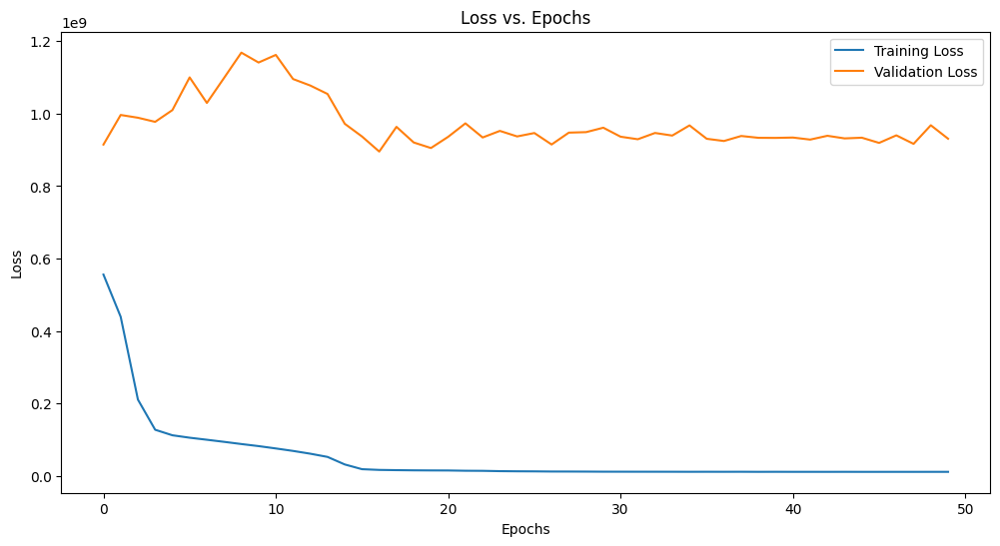

In [202]:

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')  # This will plot the validation loss
plt.title('Loss vs. Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [204]:
# Evaluate the model on the test set
y_pred = model.predict(newX_test).flatten()  # Ensure y_pred is 1-dimensional

# Ensure y_test is 1-dimensional
y_test = np.array(y_test).flatten()  # Convert y_test to a NumPy array and then flatten

# Calculate metrics
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f"Test MSE: {mse:.2f}")
print(f"Test MAE: {mae:.2f}")
print(f"Test RMSE: {rmse:.2f}")
print(f"R-squared: {r2:.2f}")

1121/1121 ━━━━━━━━━━━━━━━━━━━━ 1s 973us/step
Test MSE: 930747603.07
Test MAE: 30343.56
Test RMSE: 30508.16
R-squared: -91.93


1. **Test MSE (Mean Squared Error)**:
   - **Value:** 930,747,603.07
   - **Explanation:** MSE is the average of the squares of the errors—that is, the average squared difference between the estimated values and the actual value. A lower MSE indicates a better fit of the model to the data. MSE is sensitive to outliers and can give a higher error score if there are large errors, as these are squared and hence contribute significantly more to the overall error. The high value here suggests that there are substantial errors in predictions or possibly some very large errors inflating this metric.

2. **Test MAE (Mean Absolute Error)**:
   - **Value:** 30,343.56
   - **Explanation:** MAE measures the average magnitude of the errors in a set of predictions, without considering their direction. It’s the average over the test sample of the absolute differences between prediction and actual observation where all individual differences have equal weight. The MAE is less sensitive to outliers than MSE, providing a more robust error metric in the presence of outliers. An MAE of around 30,343.56 indicates that, on average, the model's predictions are about 30,343.56 units away from the actual values.

3. **Test RMSE (Root Mean Squared Error)**:
   - **Value:** 30,508.16
   - **Explanation:** RMSE is the square root of the mean of the squared errors. The RMSE is directly interpretable in terms of measurement units, and like MSE, is sensitive to outliers. An RMSE value of 30,508.16 means that the standard deviation of the prediction errors is about 30,508.16 units. This gives you an idea of how spread out these errors are around the mean of predictions. Comparing RMSE and MAE, since RMSE is generally higher (except in some specific cases), it shows how much larger errors are more penalized in RMSE due to the squaring of each error term.

### Comparative Insight
- The RMSE and MAE are quite close, suggesting that the errors are not extremely skewed or dominated by large outliers, as otherwise, RMSE would have been significantly higher compared to MAE due to the squaring of larger error values.
- The very high values of MSE, RMSE, and MAE indicate that your model may not be predicting very accurately, or there could be outliers affecting the predictions significantly. This could imply the model’s limitations in handling data variance or capturing the underlying pattern effectively. It might be beneficial to review the model's assumptions, feature engineering, or try different modeling approaches to reduce these error metrics.

### Model 4: LLM Implementation

Install google generative ai library

In [205]:
pip install --upgrade pip

In [206]:
pip install -U google-generativeai

Note: you may need to restart the kernel to use updated packages.


Import relevant libraries for generative ai and define markdown function for formatting ai responses

In [207]:
import pathlib
import textwrap

import google.generativeai as genai

from IPython.display import display
from IPython.display import Markdown


def to_markdown(text):
  text = text.replace('•', '  *')
  return Markdown(textwrap.indent(text, '> ', predicate=lambda _: True))

configure the LLM with the API key from Google
 - Please create a free Gemini API key at: [Gemini Key](https://ai.google.dev/gemini-api/docs/api-key)

In [208]:
genai.configure(api_key="API_KEYs")

List available models and select one that works with the API key

In [209]:
for m in genai.list_models():
  if 'generateContent' in m.supported_generation_methods:
    print(m.name)

models/gemini-1.0-pro-latest
models/gemini-1.0-pro
models/gemini-pro
models/gemini-1.0-pro-001
models/gemini-1.0-pro-vision-latest
models/gemini-pro-vision
models/gemini-1.5-pro-latest
models/gemini-1.5-pro-001
models/gemini-1.5-pro
models/gemini-1.5-pro-exp-0801
models/gemini-1.5-flash-latest
models/gemini-1.5-flash-001
models/gemini-1.5-flash
models/gemini-1.5-flash-001-tuning


Create genai object to generate text responses from prompts

In [210]:
model = genai.GenerativeModel('gemini-1.5-flash')

Reiterate list of selected features for easy referral

In [211]:
selected_features = ["Job Title", "Qualifications", "Maximum Experience (years)", "Company HQ City", "Specialization", "Company", "Job Portal", "Work Type", "Paid Time Off (PTO)", "Minimum Experience (years)", "Company Industry", "Bonuses and Incentive Programs", "Gender Preference", "Health Insurance", "Company HQ Country"]

Select 15 rows at random from data set to make predictions and compare to expected prediction based on data.
Note: 15 is the maximum number of generations we can make using the api from conducted tests

In [212]:
import random
min, max = 0, df.shape[0]
rand_indexes = []
rand_row = 0
for i in range(60):
    rand_row = random.randint(min, max)
    rand_indexes.append(rand_row)

random_newX = df.loc[rand_indexes, selected_features]
random_newLabels = numerical_var.loc[rand_indexes, labels]

input_array = []
# convert feature rows to list to make them easier to pass to the llm s inputs
for i in range(60):
  input_array.append(random_newX.iloc[i].to_list())

rand_indexes

[96164,
 52545,
 69002,
 19682,
 57583,
 98802,
 53270,
 54163,
 6420,
 81761,
 92939,
 594,
 51807,
 61389,
 71867,
 80387,
 71066,
 82742,
 54088,
 8293,
 102359,
 75951,
 110805,
 4822,
 27475,
 81041,
 69168,
 93903,
 66814,
 55980,
 62995,
 76286,
 74465,
 30553,
 14759,
 104185,
 76374,
 45368,
 99796,
 38817,
 37843,
 48521,
 67503,
 110425,
 99440,
 33970,
 8315,
 19306,
 71772,
 81099,
 79542,
 18485,
 106094,
 1131,
 58855,
 22642,
 62110,
 113609,
 88431,
 39149]

##Make some predictionns using llm and store them

Modify temperature of generate_content method to modify degree of randomness


higher temperature = higher randomness
modify max_output_tokens to modify length of resp

#### Note: the free API allows only 60 request per minute. That is equivalent to 60 tokens/min. Because we chose max_out_put token length of 20, we addedd a 20 seconds delay after every fetch cycle to give enouogh time for the token count to reset after every 60 tokens are collected in 1 minonse

In [213]:
%%time
import time
llm_preds = []
for i in input_array:
  response = model.generate_content(
      f'''What is the salary range in companies with the credentials below. THe criteria will be passed as a list with the format ["Job Title", "Qualifications", "Maximum Experience (years)", "Company HQ City", "Specialization", "Company", "Job Portal", "Work Type", "Paid Time Off (PTO)", "Minimum Experience (years)", "Company Industry", "Bonuses and Incentive Programs", "Gender Preference", "Health Insurance", "Company HQ Country"]. Below are the parameters\n {i}
      Give the salaries in the format $minimum salary - $maximum salary. Include no extra details. Just give the salary range. If you can't
      provide a salary range for an input, just skip it. Do not output any other text beside the salary range''',
      generation_config=genai.types.GenerationConfig(
          # Only one candidate for now.
          candidate_count=1,
          stop_sequences=['x'],
          max_output_tokens=20,
          temperature=0.8)
  )
  llm_preds.append(response.text)
  print(to_markdown(response.text))
  time.sleep(20)

<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>
<IPython.core.display.Markdown object>
<IPython.core.display.Mar

Extract minimum and maximum salary from predictions and store in arrays for comparison with label from data set

In [214]:
import re

# Regex pattern to remove special characters and keep only numerical characters
pattern = r'[^0-9\s]'

min_pred, max_pred = [], []
# separate lower range from upper range and store in lists as integers to compare against expected predictions
for i in llm_preds:
  print(i)
  min_pred.append(int(re.sub(pattern, '', i.split("-")[0].split("$")[1])))
  max_pred.append(int(re.sub(pattern, '', i.split("-")[1].split("$")[1])))
print(max_pred)

$75,000 - $125,000 

$80,000 - $130,000 

$30,000 - $50,000 

$40,000 - $55,000 

$100,000 - $150,000 

$50,000 - $75,000 

$30,000 - $45,000 

$10,000 - $25,000 

$65,000 - $95,000 

$50,000 - $80,000 

$65,000 - $100,000 

$10,000 - $20,000 

$60,000 - $80,000 

$60,000 - $85,000 

$65,000 - $110,000 

$60,000 - $95,000 

$40,000 - $60,000 

$55,000 - $85,000 

$60,000 - $100,000 

$45,000 - $75,000 

$80,000 - $120,000 

$60,000 - $100,000 

$60,000 - $80,000 

$65,000 - $110,000 

$50,000 - $70,000 

$70,000 - $120,000 

$40,000 - $65,000 

$40,000 - $60,000 

$60,000 - $120,000 

$50,000 - $75,000 

$30,000 - $45,000 

$30,000 - $50,000 

$10,000 - $25,000 

$50,000 - $80,000 

$80,000 - $120,000 

$50,000 - $80,000 

$55,000 - $75,000 

$50,000 - $75,000 

$15,000 - $30,000 

$80,000 - $120,000 

$40,000 - $65,000 

$3,000 - $6,000 

$60,000 - $85,000 

$50,000 - $80,000 

$20,000 - $40,000 

$80,000 - $120,000 

$30,000 - $45,000 

$100,000 - $150,000 

$45,000 - $75,000 

$65,0

Compute errors of predictions

In [215]:
error_min = (1/len(max_pred)*np.sum(np.abs((min_pred - random_newLabels.iloc[:len(max_pred), 0])/random_newLabels.iloc[:len(max_pred), 0])))
print("Test error for Min salary is: ", round(error_min, 8)*100, "%")
print("Test accuracy for Min salary is: ", round(100 - error_min*100, 8), "%")

error_max = (1/len(max_pred)*np.sum(np.abs((max_pred - random_newLabels.iloc[:len(max_pred), 1])/random_newLabels.iloc[:len(max_pred), 1])))
print("Test error for Max salary is: ", round(error_max, 8)*100, "%")
print("Test accuracy for Max salary is: ", round(100 - error_max*100, 8), "%")

Test error for Min salary is:  29.725515 %
Test accuracy for Min salary is:  70.27448549 %
Test error for Max salary is:  31.971172 %
Test accuracy for Max salary is:  68.02882763 %


LLM Grants a low accuracy with respect to the labels as compared to the other models. The degree of the LLM is also quite high making it less desirable to be our choice model for deployment

### Analysis and Comparison of the Models

1. **Multilinear Regression:**
   - **Test Accuracy:**
     - Max Salary: 92.70%
     - Min Salary: 92.19%
   - **Test Error:**
     - Max Salary: 7.30%
     - Min Salary: 7.81%
   - **Pros:**
     - High accuracy for both max and min salary predictions.
     - Low test errors.
   - **Cons:**
     - None significant based on the provided data.

2. **Voting Regressor:**
   - **Cross-Validation R² Scores:**
     - Random Forest: -0.0236
     - XGBoost: -0.0422
     - Decision Tree: -1.0455
     - Gradient Boosting: -0.0016
   - **Ensemble Model:**
     - Test MSE: 10,026,488.67
     - Test MAE: 2,734.81
     - R² Scores:
       - Random Forest: -0.0033
       - XGBoost: -0.0010
       - Decision Tree: -0.0409
       - Gradient Boosting: -0.0014
   - **Pros:**
     - Uses ensemble methods, which typically aim to improve performance.
   - **Cons:**
     - All individual models and the ensemble model have negative R² scores, indicating poor performance.
     - High test MSE and MAE for the ensemble model.

3. **Functional API:**
   - **Test MSE:** 955,857,115.20
   - **Test MAE:** 30,754.53
   - **Test RMSE:** 30,916.94
   - **R-squared:** -94.4346
   - **Pros:**
     - Utilizes advanced neural network architecture.
   - **Cons:**
     - Extremely high test errors.
     - Very poor R-squared value, indicating a poor fit to the data.

4. **LLM Implementation:**
   - **Test Accuracy:**
     - Min Salary: 70.27448549 %
     - Max Salary: 68.02882763 %
   - **Test Error:**
     - Min Salary:  29.725515 %
     - Max Salary: 31.971172 %
   - **Pros:**
     - Moderate accuracy for both salary predictions.
   - **Cons:**
     - Higher test errors compared to the multilinear regression model.

### Conclusion

- **Best Model:** The **Multilinear Regression** model is the best based on the provided data, achieving high accuracy (over 92% for both max and min salary predictions) and low test errors.
- **Voting Regressor:** Despite its ensemble nature, the Voting Regressor performs poorly with negative R² scores and high test errors.
- **Functional API:** This model shows very poor performance with extremely high errors and a negative R-squared value.
- **LLM Implementation:** While it has moderate accuracy, its performance is still lower than that of the Multilinear Regression model.

#### Prompts Used to make the work 
- What are the different scaling techniques in machine learning and when are they used?
- How do I filter data from a CSV file based on selected columns without including the columns I don't need?
- Why can't I install genai in my Jupyter notebook?
- Resource quota exceeded?
- How can I avoid warning to appear during training ?
- Help me with the Regex code to transform a dictionary into an array ?
- Explain the use of common layers in a functional API
- How to create a plot with more than 2 variables ?
- How to download my data as a CSV in Jupyter Notebook ?
- How to share a Jupyter Notebook ?
- What is the difference between grid search CV and Randomised search CV and how does it affect hyperparameter tuning ?
- How do I implement a dropdown from a csv file heading columns for a dropdown feature in streamlit selectbox?